In [1]:
%matplotlib inline 
import json
import numpy as np
import operator
import os
import pandas
import pylab as plt
import random
from ase.data import reference_states, atomic_numbers
from sklearn.neighbors import KernelDensity
from pyiron.project import Project

/scratch/janssen/pyiron_meltingpoint/.snakemake/conda/9e28c1ea/lib/python3.9/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.neighbors.kde module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
import matplotlib as mpl
mpl.rc('font', family='Times New Roman')
plt.rcParams["mathtext.fontset"] = "stix"

In [3]:
from pyiron.thermodynamics.interfacemethod import freeze_one_half, remove_selective_dynamics, set_server, create_job_template, fix_iso, fix_z_dir, half_velocity, minimize_pos, minimize_vol, next_calc, npt_solid, npt_liquid, next_step_funct, round_temperature_next, strain_circle, analyse_minimized_structure, get_press, get_center_point, get_strain_lst, get_nve_job_name, plot_solid_liquid_ratio, ratio_selection, plot_equilibration, plot_melting_point_prediction, calc_temp_iteration, get_initial_melting_temperature_guess, validate_convergence, initialise_iterators, get_voronoi_volume, check_for_holes

In [4]:
pr = Project('melting')

In [5]:
input_file = os.path.join(pr.path, 'input.json')
output_file = os.path.join(pr.path, 'output.json')

In [6]:
# Parameters
input_file = "input.json"
output_file = "output.json"


In [7]:
pr.job_table()

""


In [8]:
if os.path.exists(input_file) and os.stat(input_file).st_size != 0:
    with open(input_file, 'r') as f:
        input_dict = json.load(f)
else:
    input_dict = {
        "config": [
            "pair_style morse 9.97749\n",
            "pair_coeff * * 0.4174 1.3885 2.845\n"
        ],
        "species": ["Al"],
        "element": "Al"
    }


In [9]:
input_dict

{'config': ['pair_style sw \n', 'pair_coeff * * Si.sw Si\n'],
 'filename': './examples/diaSi//Si.sw',
 'species': ['Si'],
 'element': 'Si',
 'cpu_cores': 8}

In [10]:
pot_dict = input_dict.copy()

In [11]:
if 'model' not in pot_dict.keys():
    pot_dict['model'] = 'Lammps'
if 'name' not in pot_dict.keys():
    pot_dict['name'] = 'CustomPotential'
if 'filename' not in pot_dict.keys():
    pot_path = []
else:
    pot_path = [os.path.abspath(pot_dict['filename'])]
potential = pandas.DataFrame({'Config': [pot_dict['config']],
                             'Filename': [pot_path],
                             'Model': [pot_dict['model']],
                             'Name': [pot_dict['name']],
                             'Species': [pot_dict['species']]
                             })

In [12]:
project_parameter = {
    'project': pr,
    'run_time_steps': 50000,
    'nvt_run_time_steps': 10000,
    'nve_run_time_steps': 10000,
    'temperature_left': 0,
    'temperature_right': 1000,
    'strain_run_time_steps': 1000,
    'convergence_criterion': 1,
    'potential': potential,
    'cpu_cores': 1, 
    'job_type': pr.job_type.Lammps,
    'enable_h5md': False,
    'points': 21,
    'boundary_value': 0.25,
    'ratio_boundary': 0.25,
    'timestep_lst': [2, 2, 1],
    'fit_range_lst': [0.05, 0.01, 0.01],
    'nve_run_time_steps_lst': [25000, 20000, 50000],
    'number_of_atoms': 8000, 
}

In [13]:
for k in input_dict.keys():
    project_parameter[k] = input_dict[k]

In [14]:
if 'crystalstructure' not in project_parameter.keys():
    project_parameter['crystalstructure'] = reference_states[atomic_numbers[project_parameter['element']]]['symmetry']

In [15]:
if 'seed' not in project_parameter.keys():
    project_parameter['seed'] = random.randint(0,99999)
project_parameter['seed']

59849

In [16]:
# Values from a previous calculation can be inserted here to reproduce the results 
step_dict = {}
if os.path.exists(output_file):
    with open(output_file, 'r') as f:
        step_dict_str = json.load(f)
    for k,v in step_dict_str.items():
        step_dict[int(k)] = v
step_dict

{}

# From here on the notebook is automated - no change required !

In [17]:
step_count = 0
temperature_next = None
enable_iteration = True
convergence_goal_achieved = False

In [18]:
pr = project_parameter['project']

In [19]:
if 'lattice_constant' in project_parameter.keys():
    basis = pr.create_structure(project_parameter['element'], project_parameter['crystalstructure'].lower(), project_parameter['lattice_constant'])
elif project_parameter['crystalstructure'] == 'hcp':
    basis = pr.create_ase_bulk(project_parameter['element'], project_parameter['crystalstructure'].lower(), cubic=False)
else:
    basis = pr.create_ase_bulk(project_parameter['element'], project_parameter['crystalstructure'].lower(), cubic=True)
basis_lst = [basis.repeat([i, i, i]) for i in range(5,30)]
basis = basis_lst[np.argmin([np.abs(len(b)-project_parameter['number_of_atoms']/2) for b in basis_lst])]

In [20]:
basis.analyse_ovito_cna_adaptive()

{'CommonNeighborAnalysis.counts.OTHER': 4096,
 'CommonNeighborAnalysis.counts.FCC': 0,
 'CommonNeighborAnalysis.counts.HCP': 0,
 'CommonNeighborAnalysis.counts.BCC': 0,
 'CommonNeighborAnalysis.counts.ICO': 0}

In [21]:
basis.plot3d()

NGLWidget()

In [22]:
# pr.remove_jobs(recursive=True)

In [23]:
timestep_iter, fit_range_iter, nve_run_time_steps_iter = initialise_iterators(project_parameter)
timestep = next(timestep_iter)
fit_range = next(fit_range_iter)
nve_run_time_steps = next(nve_run_time_steps_iter)

In [24]:
pr.job_table()

""


# Step 1: set up the solid sample and roughly estimate a melting point

In [25]:
ham_minimize_pos= minimize_pos(
    structure=basis, 
    project_parameter=project_parameter
)

/scratch/janssen/pyiron_meltingpoint/.snakemake/conda/9e28c1ea/lib/python3.9/site-packages/pyiron/lammps/interactive.py:245: UserWarning: e_tol is deprecated as of vers. 0.3.0. It is not guaranteed to be in service in vers. 0.4.0. Use ionic_energy_tolerance instead.
  warnings.warn(
/scratch/janssen/pyiron_meltingpoint/.snakemake/conda/9e28c1ea/lib/python3.9/site-packages/pyiron/lammps/interactive.py:251: UserWarning: f_tol is deprecated as of vers. 0.3.0. It is not guaranteed to be in service in vers. 0.4.0. Use ionic_force_tolerance instead.
  warnings.warn(


The job minimize_pos was saved and received the ID: 1


In [26]:
ham_minimize_vol = minimize_vol(
    structure=ham_minimize_pos.get_structure(), 
    project_parameter=project_parameter
)

/scratch/janssen/pyiron_meltingpoint/.snakemake/conda/9e28c1ea/lib/python3.9/site-packages/pyiron/lammps/interactive.py:245: UserWarning: e_tol is deprecated as of vers. 0.3.0. It is not guaranteed to be in service in vers. 0.4.0. Use ionic_energy_tolerance instead.
  warnings.warn(
/scratch/janssen/pyiron_meltingpoint/.snakemake/conda/9e28c1ea/lib/python3.9/site-packages/pyiron/lammps/interactive.py:251: UserWarning: f_tol is deprecated as of vers. 0.3.0. It is not guaranteed to be in service in vers. 0.4.0. Use ionic_force_tolerance instead.
  warnings.warn(


The job minimize_vol was saved and received the ID: 2


In [27]:
temperature_next, structure_left = get_initial_melting_temperature_guess(
    project_parameter=project_parameter, 
    ham_minimize_vol=ham_minimize_vol, 
    temperature_next=temperature_next
)

The job temp_heating_1000 was saved and received the ID: 3


The job temp_heating_2000 was saved and received the ID: 4


The job temp_heating_3000 was saved and received the ID: 5


The job temp_heating_4000 was saved and received the ID: 6


The job temp_heating_3500_0 was saved and received the ID: 7


The job temp_heating_3250_0 was saved and received the ID: 8


The job temp_heating_3125_0 was saved and received the ID: 9


The job temp_heating_3062_5 was saved and received the ID: 10


The job temp_heating_3031_25 was saved and received the ID: 11


The job temp_heating_3015_625 was saved and received the ID: 12


The job temp_heating_3023_4375 was saved and received the ID: 13


In [28]:
temperature_next   # +/- 100K 

3023

In [29]:
if step_count in step_dict.keys():
    temperature_next = step_dict[step_count]['temperature_next']
else: 
    step_dict[step_count]= {'temperature_next': temperature_next}

In [30]:
step_dict

{0: {'temperature_next': 3023}}

# Step 2: set up the interface structure

The job ham_npt_solid_3023 was saved and received the ID: 14


The job ham_npt_liquid_high_4023 was saved and received the ID: 15


The job ham_npt_liquid_low_3023 was saved and received the ID: 16


2020-11-30 16:32:01,569 - pyiron_log - WARNING - Job 'ham_nve_0_95_3023_0' does not exist and cannot be loaded


The job ham_nvt_0_95_3023_0 was saved and received the ID: 17


2020-11-30 16:34:15,420 - pyiron_log - WARNING - Job 'ham_nve_0_955_3023_0' does not exist and cannot be loaded


The job ham_nvt_0_955_3023_0 was saved and received the ID: 18


2020-11-30 16:36:27,490 - pyiron_log - WARNING - Job 'ham_nve_0_96_3023_0' does not exist and cannot be loaded


The job ham_nvt_0_96_3023_0 was saved and received the ID: 19


2020-11-30 16:38:37,996 - pyiron_log - WARNING - Job 'ham_nve_0_965_3023_0' does not exist and cannot be loaded


The job ham_nvt_0_965_3023_0 was saved and received the ID: 20


2020-11-30 16:40:46,940 - pyiron_log - WARNING - Job 'ham_nve_0_97_3023_0' does not exist and cannot be loaded


The job ham_nvt_0_97_3023_0 was saved and received the ID: 21


2020-11-30 16:42:54,169 - pyiron_log - WARNING - Job 'ham_nve_0_975_3023_0' does not exist and cannot be loaded


The job ham_nvt_0_975_3023_0 was saved and received the ID: 22


2020-11-30 16:45:00,163 - pyiron_log - WARNING - Job 'ham_nve_0_98_3023_0' does not exist and cannot be loaded


The job ham_nvt_0_98_3023_0 was saved and received the ID: 23


2020-11-30 16:47:04,067 - pyiron_log - WARNING - Job 'ham_nve_0_985_3023_0' does not exist and cannot be loaded


The job ham_nvt_0_985_3023_0 was saved and received the ID: 24


2020-11-30 16:49:07,046 - pyiron_log - WARNING - Job 'ham_nve_0_99_3023_0' does not exist and cannot be loaded


The job ham_nvt_0_99_3023_0 was saved and received the ID: 25


2020-11-30 16:51:08,129 - pyiron_log - WARNING - Job 'ham_nve_0_995_3023_0' does not exist and cannot be loaded


The job ham_nvt_0_995_3023_0 was saved and received the ID: 26


2020-11-30 16:53:07,683 - pyiron_log - WARNING - Job 'ham_nve_1_0_3023_0' does not exist and cannot be loaded


The job ham_nvt_1_0_3023_0 was saved and received the ID: 27


2020-11-30 16:55:06,009 - pyiron_log - WARNING - Job 'ham_nve_1_005_3023_0' does not exist and cannot be loaded


The job ham_nvt_1_005_3023_0 was saved and received the ID: 28


2020-11-30 16:57:03,091 - pyiron_log - WARNING - Job 'ham_nve_1_01_3023_0' does not exist and cannot be loaded


The job ham_nvt_1_01_3023_0 was saved and received the ID: 29


2020-11-30 16:58:59,137 - pyiron_log - WARNING - Job 'ham_nve_1_015_3023_0' does not exist and cannot be loaded


The job ham_nvt_1_015_3023_0 was saved and received the ID: 30


2020-11-30 17:00:53,908 - pyiron_log - WARNING - Job 'ham_nve_1_02_3023_0' does not exist and cannot be loaded


The job ham_nvt_1_02_3023_0 was saved and received the ID: 31


2020-11-30 17:02:47,505 - pyiron_log - WARNING - Job 'ham_nve_1_025_3023_0' does not exist and cannot be loaded


The job ham_nvt_1_025_3023_0 was saved and received the ID: 32


2020-11-30 17:04:39,608 - pyiron_log - WARNING - Job 'ham_nve_1_03_3023_0' does not exist and cannot be loaded


The job ham_nvt_1_03_3023_0 was saved and received the ID: 33


2020-11-30 17:06:31,088 - pyiron_log - WARNING - Job 'ham_nve_1_035_3023_0' does not exist and cannot be loaded


The job ham_nvt_1_035_3023_0 was saved and received the ID: 34


2020-11-30 17:08:21,903 - pyiron_log - WARNING - Job 'ham_nve_1_04_3023_0' does not exist and cannot be loaded


The job ham_nvt_1_04_3023_0 was saved and received the ID: 35


2020-11-30 17:10:19,786 - pyiron_log - WARNING - Job 'ham_nve_1_045_3023_0' does not exist and cannot be loaded


The job ham_nvt_1_045_3023_0 was saved and received the ID: 36


2020-11-30 17:12:18,215 - pyiron_log - WARNING - Job 'ham_nve_1_05_3023_0' does not exist and cannot be loaded


The job ham_nvt_1_05_3023_0 was saved and received the ID: 37


The job ham_nve_0_95_3023_0 was saved and received the ID: 38


The job ham_nve_0_955_3023_0 was saved and received the ID: 39


The job ham_nve_0_96_3023_0 was saved and received the ID: 40


The job ham_nve_0_965_3023_0 was saved and received the ID: 41


The job ham_nve_0_97_3023_0 was saved and received the ID: 42


The job ham_nve_0_975_3023_0 was saved and received the ID: 43


The job ham_nve_0_98_3023_0 was saved and received the ID: 44


The job ham_nve_0_985_3023_0 was saved and received the ID: 45


The job ham_nve_0_99_3023_0 was saved and received the ID: 46


The job ham_nve_0_995_3023_0 was saved and received the ID: 47


The job ham_nve_1_0_3023_0 was saved and received the ID: 48


The job ham_nve_1_005_3023_0 was saved and received the ID: 49


The job ham_nve_1_01_3023_0 was saved and received the ID: 50


The job ham_nve_1_015_3023_0 was saved and received the ID: 51


The job ham_nve_1_02_3023_0 was saved and received the ID: 52


The job ham_nve_1_025_3023_0 was saved and received the ID: 53


The job ham_nve_1_03_3023_0 was saved and received the ID: 54


The job ham_nve_1_035_3023_0 was saved and received the ID: 55


The job ham_nve_1_04_3023_0 was saved and received the ID: 56


The job ham_nve_1_045_3023_0 was saved and received the ID: 57


The job ham_nve_1_05_3023_0 was saved and received the ID: 58


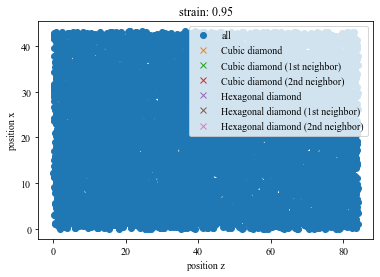

No handles with labels found to put in legend.


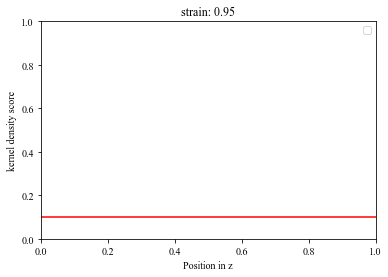

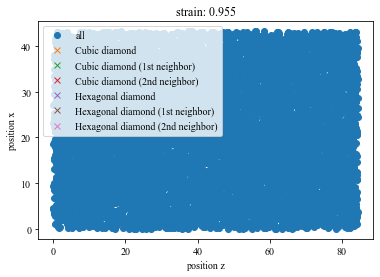

No handles with labels found to put in legend.


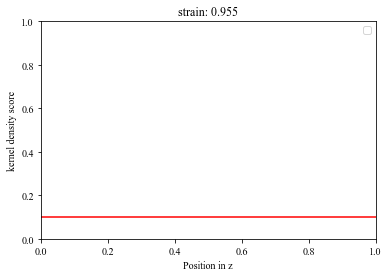

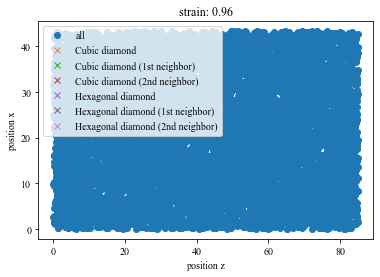

No handles with labels found to put in legend.


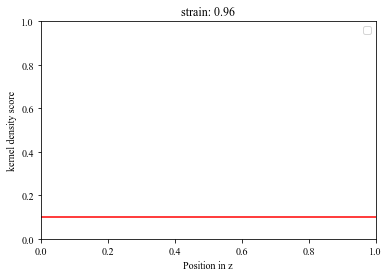

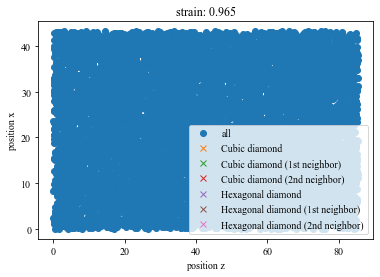

No handles with labels found to put in legend.


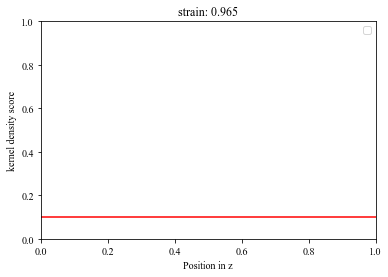

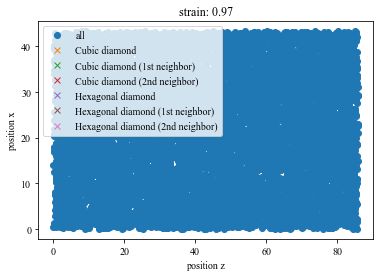

No handles with labels found to put in legend.


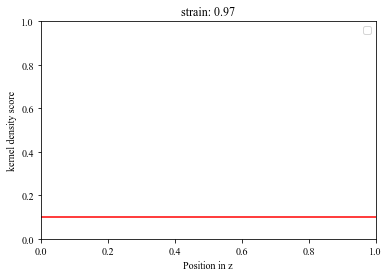

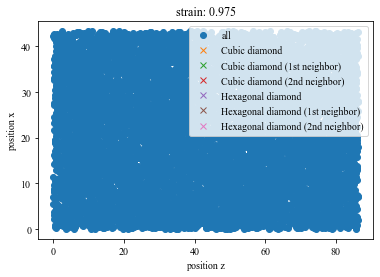

No handles with labels found to put in legend.


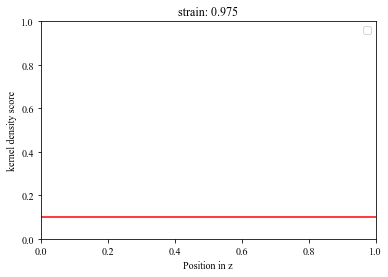

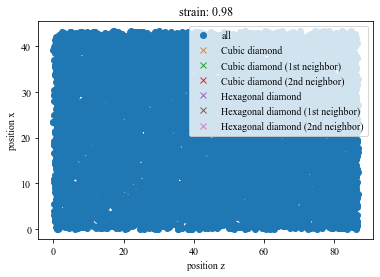

No handles with labels found to put in legend.


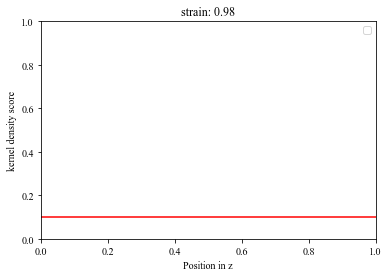

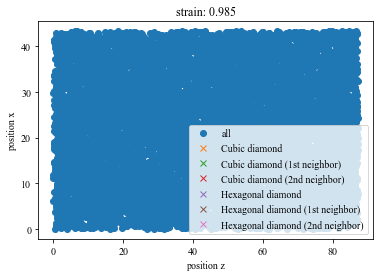

No handles with labels found to put in legend.


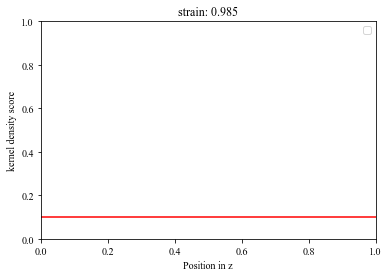

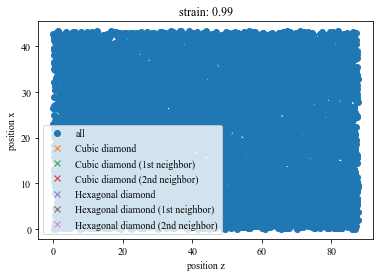

No handles with labels found to put in legend.


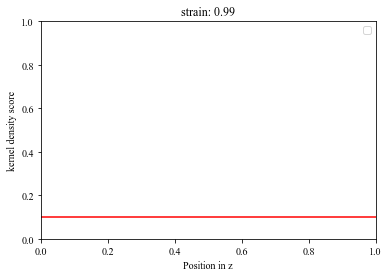

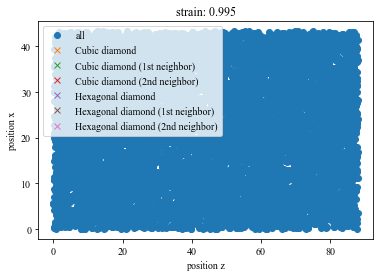

No handles with labels found to put in legend.


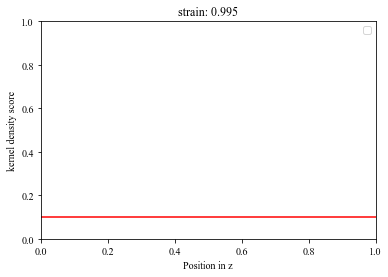

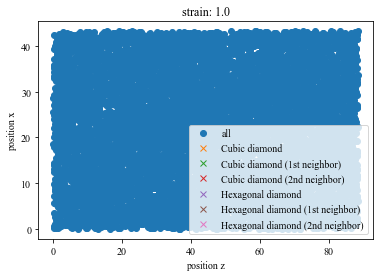

No handles with labels found to put in legend.


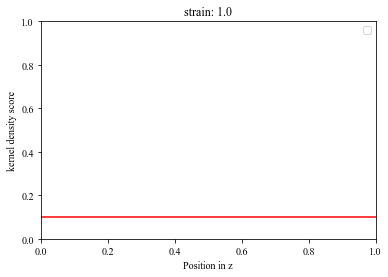

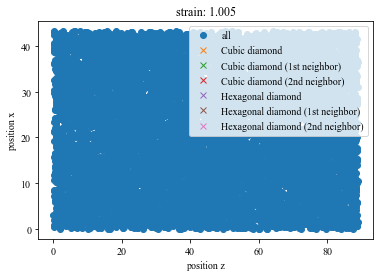

No handles with labels found to put in legend.


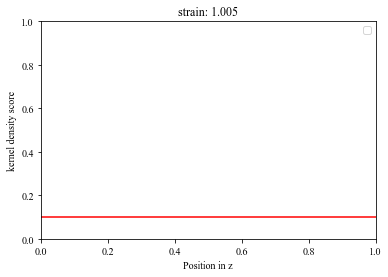

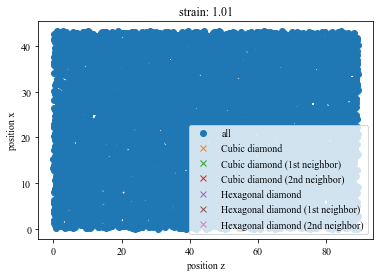

No handles with labels found to put in legend.


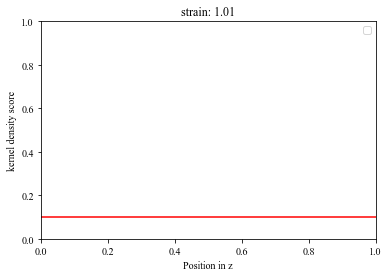

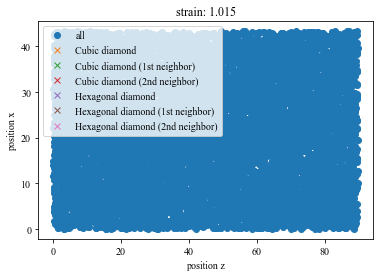

No handles with labels found to put in legend.


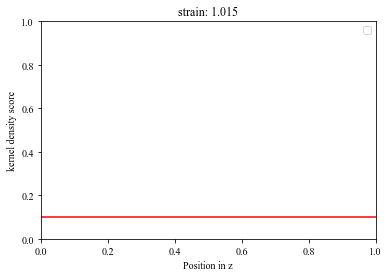

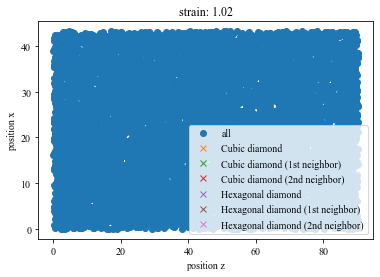

No handles with labels found to put in legend.


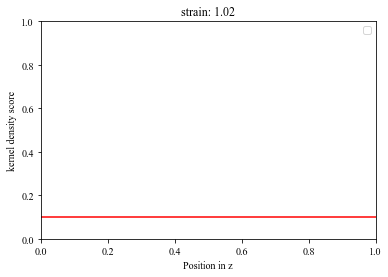

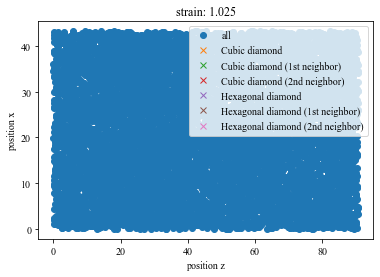

No handles with labels found to put in legend.


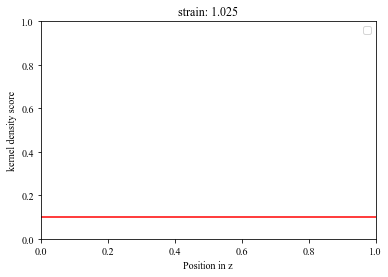

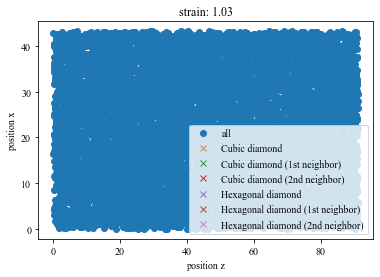

No handles with labels found to put in legend.


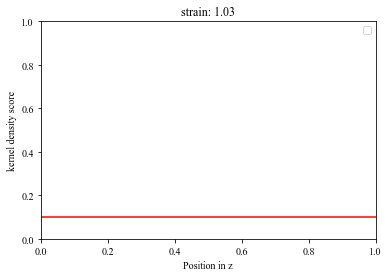

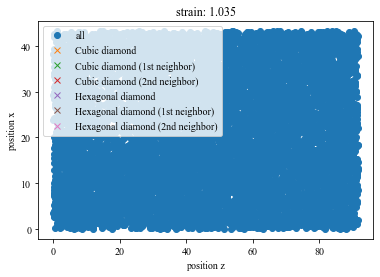

No handles with labels found to put in legend.


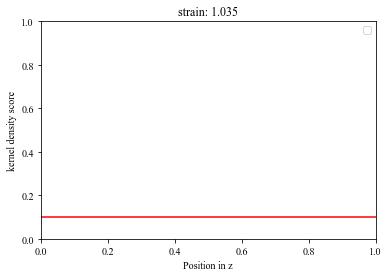

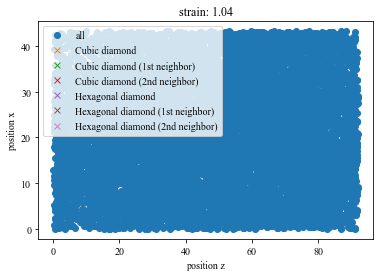

No handles with labels found to put in legend.


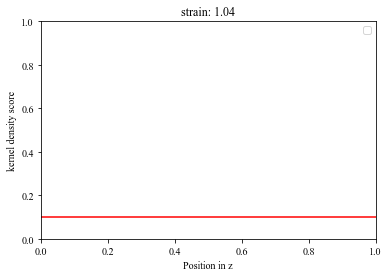

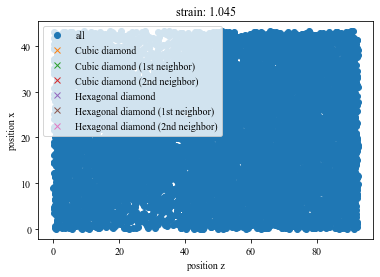

No handles with labels found to put in legend.


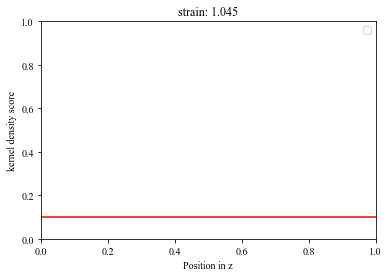

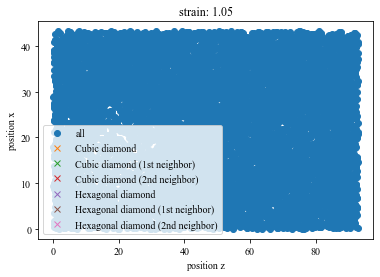

No handles with labels found to put in legend.


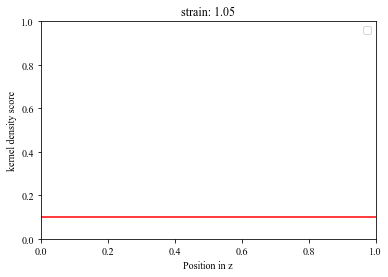

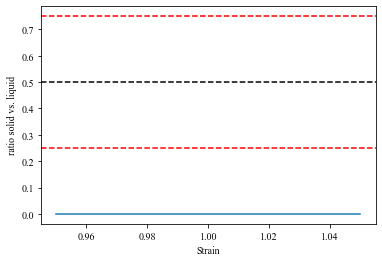

In [31]:
temperature_next, temperature_mean, temperature_left, temperature_right, strain_result_lst, pressure_result_lst = calc_temp_iteration(
        basis=ham_minimize_vol.get_structure().repeat([1,1,2]), 
        temperature_next=temperature_next, 
        project_parameter=project_parameter,
        timestep = timestep,
        nve_run_time_steps=nve_run_time_steps, 
        fit_range=fit_range,  
        center=None,
        debug_plot=True)

In [32]:
temperature_next, temperature_mean, temperature_left, temperature_right

(2720.7000000000003, 0.0, 0.0, 0.0)

# Step 3: run NVT and NVE MD

In [33]:
output = validate_convergence(
    pr=pr,
    temperature_left=temperature_left,
    temperature_next=temperature_next,
    temperature_right=temperature_right,
    enable_iteration=enable_iteration,
    timestep_iter=timestep_iter,
    timestep_lst=project_parameter['timestep_lst'],
    timestep=timestep,
    fit_range_iter=fit_range_iter,
    fit_range_lst=project_parameter['fit_range_lst'],
    fit_range=fit_range,
    nve_run_time_steps_iter=nve_run_time_steps_iter,
    nve_run_time_steps_lst=project_parameter['nve_run_time_steps_lst'],
    nve_run_time_steps=nve_run_time_steps,
    strain_result_lst=strain_result_lst,
    pressure_result_lst=pressure_result_lst,
    step_count=step_count,
    step_dict=step_dict,
    boundary_value=project_parameter['boundary_value'],
    ratio_boundary=project_parameter['ratio_boundary'],
    convergence_goal=project_parameter['convergence_criterion'],
    output_file=output_file
)
convergence_goal_achieved, enable_iteration, step_count, step_dict, timestep, fit_range, nve_run_time_steps, boundary_value, ratio_boundary, temperature_next, center = output

In [34]:
step_dict[step_count]

{'timestep': 2,
 'fit_range': 0.05,
 'nve_run_time_steps': 25000,
 'boundary_value': 0.25,
 'ratio_boundary': 0.25,
 'temperature_next': 2720.7000000000003,
 'center': 1.0}

In [35]:
convergence_goal_achieved

False

# Step 4: full cycle, predict the final melting point

The job ham_npt_solid_2720_7 was saved and received the ID: 59


The job ham_npt_liquid_high_3720_7 was saved and received the ID: 60


The job ham_npt_liquid_low_2720_7 was saved and received the ID: 61


2020-11-30 19:31:55,465 - pyiron_log - WARNING - Job 'ham_nve_0_95_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_0_95_2720_7_0 was saved and received the ID: 62


2020-11-30 19:34:13,967 - pyiron_log - WARNING - Job 'ham_nve_0_955_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_0_955_2720_7_0 was saved and received the ID: 63


2020-11-30 19:36:30,395 - pyiron_log - WARNING - Job 'ham_nve_0_96_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_0_96_2720_7_0 was saved and received the ID: 64


2020-11-30 19:38:44,449 - pyiron_log - WARNING - Job 'ham_nve_0_965_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_0_965_2720_7_0 was saved and received the ID: 65


2020-11-30 19:40:57,094 - pyiron_log - WARNING - Job 'ham_nve_0_97_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_0_97_2720_7_0 was saved and received the ID: 66


2020-11-30 19:43:07,824 - pyiron_log - WARNING - Job 'ham_nve_0_975_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_0_975_2720_7_0 was saved and received the ID: 67


2020-11-30 19:45:16,844 - pyiron_log - WARNING - Job 'ham_nve_0_98_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_0_98_2720_7_0 was saved and received the ID: 68


2020-11-30 19:47:24,147 - pyiron_log - WARNING - Job 'ham_nve_0_985_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_0_985_2720_7_0 was saved and received the ID: 69


2020-11-30 19:49:29,442 - pyiron_log - WARNING - Job 'ham_nve_0_99_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_0_99_2720_7_0 was saved and received the ID: 70


2020-11-30 19:51:33,179 - pyiron_log - WARNING - Job 'ham_nve_0_995_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_0_995_2720_7_0 was saved and received the ID: 71


2020-11-30 19:53:35,586 - pyiron_log - WARNING - Job 'ham_nve_1_0_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_1_0_2720_7_0 was saved and received the ID: 72


2020-11-30 19:55:36,326 - pyiron_log - WARNING - Job 'ham_nve_1_005_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_1_005_2720_7_0 was saved and received the ID: 73


2020-11-30 19:57:36,372 - pyiron_log - WARNING - Job 'ham_nve_1_01_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_1_01_2720_7_0 was saved and received the ID: 74


2020-11-30 19:59:34,160 - pyiron_log - WARNING - Job 'ham_nve_1_015_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_1_015_2720_7_0 was saved and received the ID: 75


2020-11-30 20:01:30,767 - pyiron_log - WARNING - Job 'ham_nve_1_02_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_1_02_2720_7_0 was saved and received the ID: 76


2020-11-30 20:03:26,238 - pyiron_log - WARNING - Job 'ham_nve_1_025_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_1_025_2720_7_0 was saved and received the ID: 77


2020-11-30 20:05:20,942 - pyiron_log - WARNING - Job 'ham_nve_1_03_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_1_03_2720_7_0 was saved and received the ID: 78


2020-11-30 20:07:13,889 - pyiron_log - WARNING - Job 'ham_nve_1_035_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_1_035_2720_7_0 was saved and received the ID: 79


2020-11-30 20:09:05,951 - pyiron_log - WARNING - Job 'ham_nve_1_04_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_1_04_2720_7_0 was saved and received the ID: 80


2020-11-30 20:10:56,749 - pyiron_log - WARNING - Job 'ham_nve_1_045_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_1_045_2720_7_0 was saved and received the ID: 81


2020-11-30 20:12:53,236 - pyiron_log - WARNING - Job 'ham_nve_1_05_2720_7_0' does not exist and cannot be loaded


The job ham_nvt_1_05_2720_7_0 was saved and received the ID: 82


The job ham_nve_0_95_2720_7_0 was saved and received the ID: 83


The job ham_nve_0_955_2720_7_0 was saved and received the ID: 84


The job ham_nve_0_96_2720_7_0 was saved and received the ID: 85


The job ham_nve_0_965_2720_7_0 was saved and received the ID: 86


The job ham_nve_0_97_2720_7_0 was saved and received the ID: 87


The job ham_nve_0_975_2720_7_0 was saved and received the ID: 88


The job ham_nve_0_98_2720_7_0 was saved and received the ID: 89


The job ham_nve_0_985_2720_7_0 was saved and received the ID: 90


The job ham_nve_0_99_2720_7_0 was saved and received the ID: 91


The job ham_nve_0_995_2720_7_0 was saved and received the ID: 92


The job ham_nve_1_0_2720_7_0 was saved and received the ID: 93


The job ham_nve_1_005_2720_7_0 was saved and received the ID: 94


The job ham_nve_1_01_2720_7_0 was saved and received the ID: 95


The job ham_nve_1_015_2720_7_0 was saved and received the ID: 96


The job ham_nve_1_02_2720_7_0 was saved and received the ID: 97


The job ham_nve_1_025_2720_7_0 was saved and received the ID: 98


The job ham_nve_1_03_2720_7_0 was saved and received the ID: 99


The job ham_nve_1_035_2720_7_0 was saved and received the ID: 100


The job ham_nve_1_04_2720_7_0 was saved and received the ID: 101


The job ham_nve_1_045_2720_7_0 was saved and received the ID: 102


The job ham_nve_1_05_2720_7_0 was saved and received the ID: 103


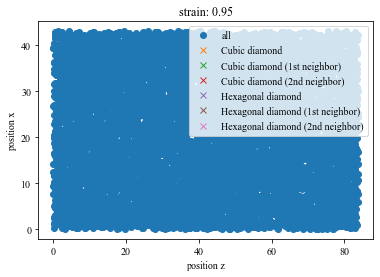

No handles with labels found to put in legend.


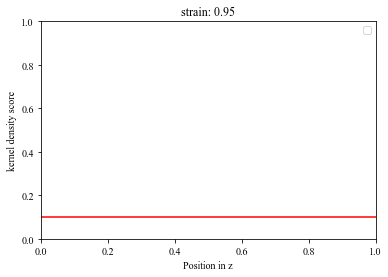

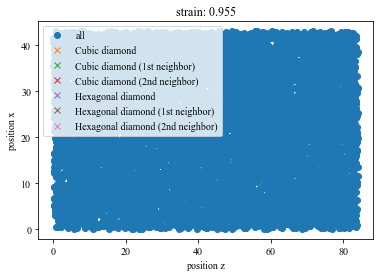

No handles with labels found to put in legend.


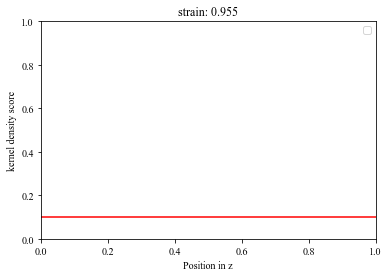

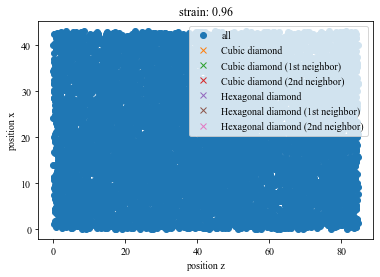

No handles with labels found to put in legend.


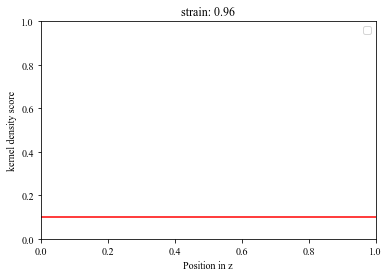

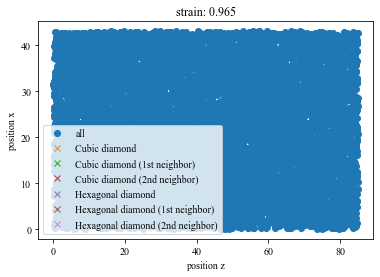

No handles with labels found to put in legend.


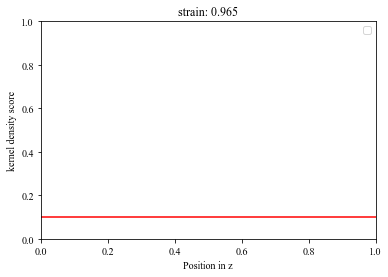

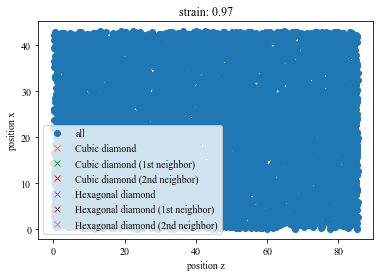

No handles with labels found to put in legend.


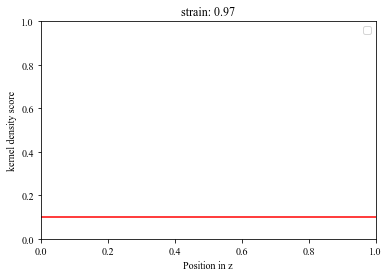

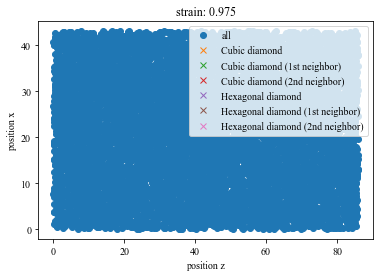

No handles with labels found to put in legend.


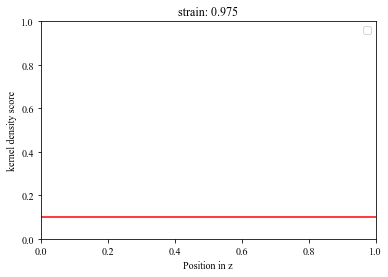

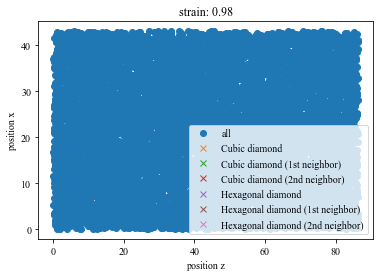

No handles with labels found to put in legend.


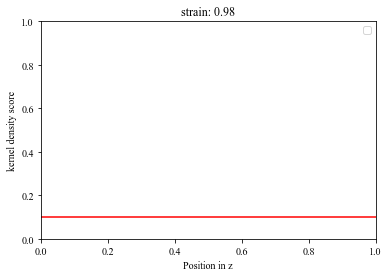

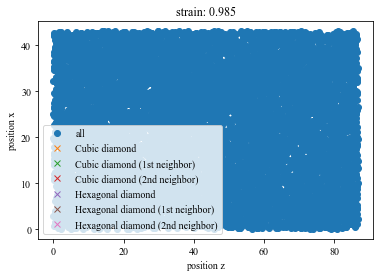

No handles with labels found to put in legend.


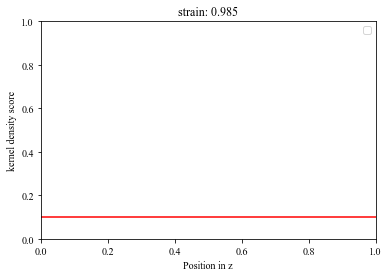

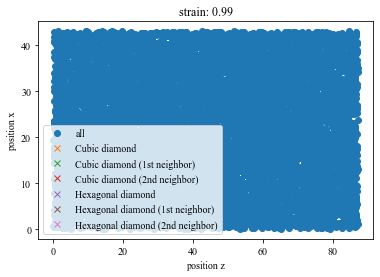

No handles with labels found to put in legend.


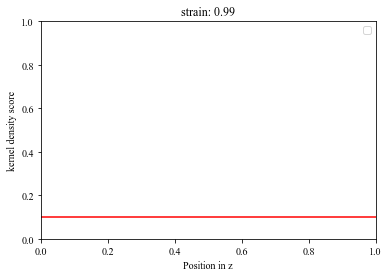

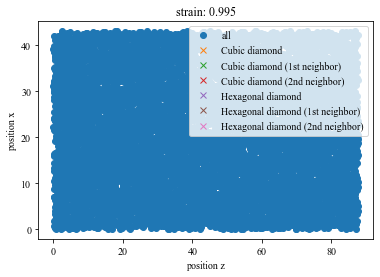

No handles with labels found to put in legend.


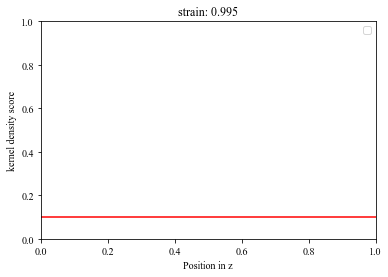

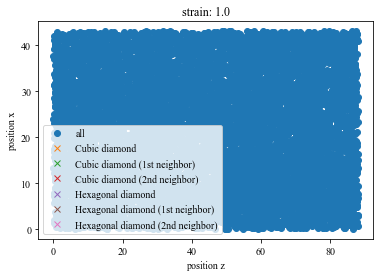

No handles with labels found to put in legend.


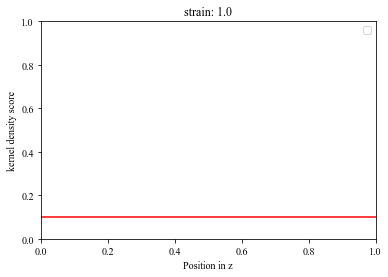

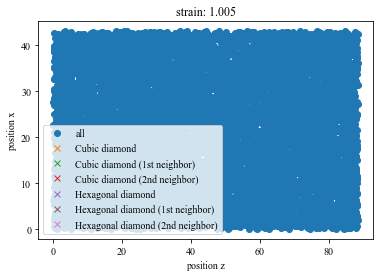

No handles with labels found to put in legend.


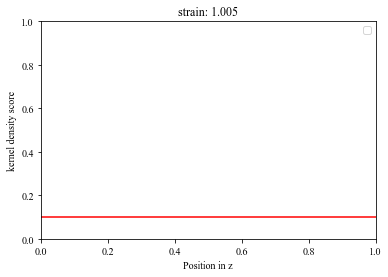

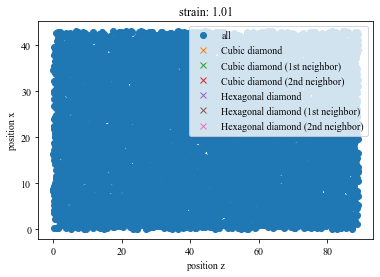

No handles with labels found to put in legend.


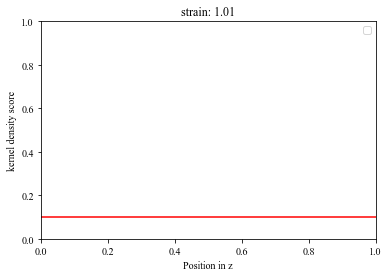

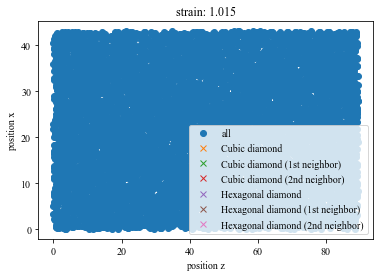

No handles with labels found to put in legend.


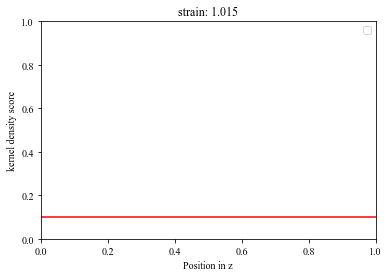

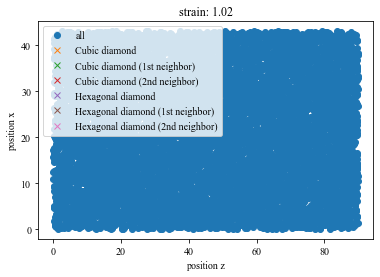

No handles with labels found to put in legend.


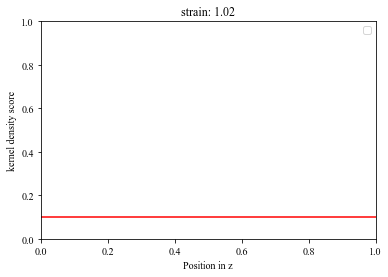

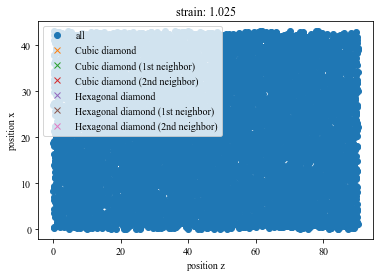

No handles with labels found to put in legend.


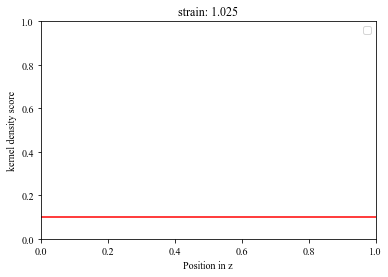

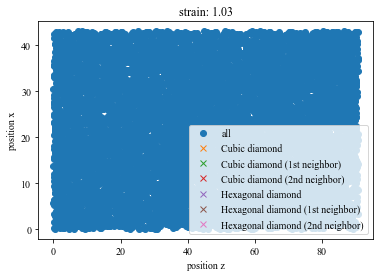

No handles with labels found to put in legend.


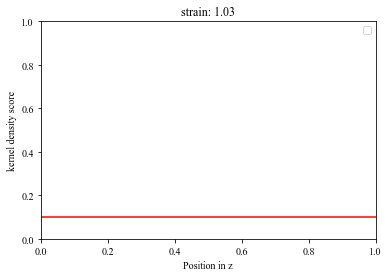

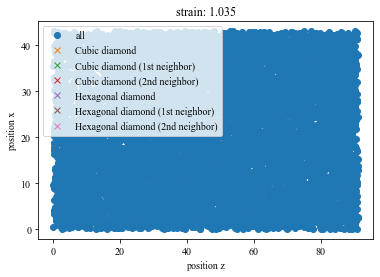

No handles with labels found to put in legend.


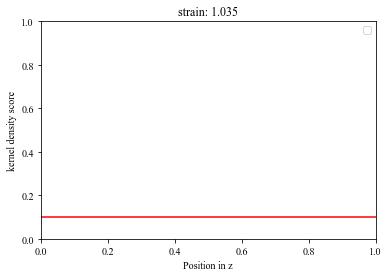

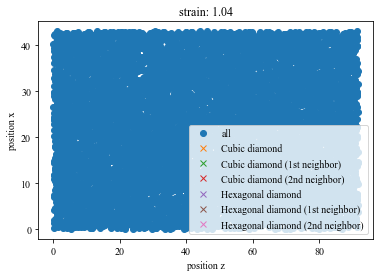

No handles with labels found to put in legend.


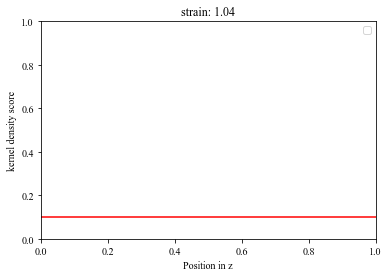

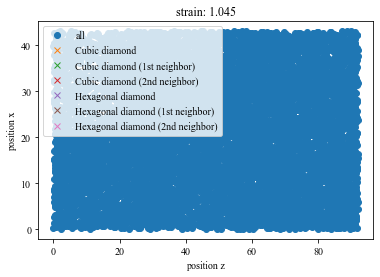

No handles with labels found to put in legend.


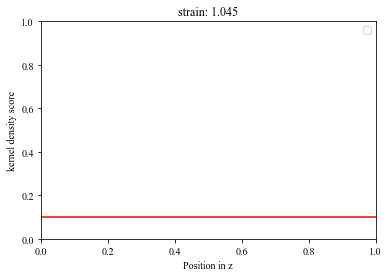

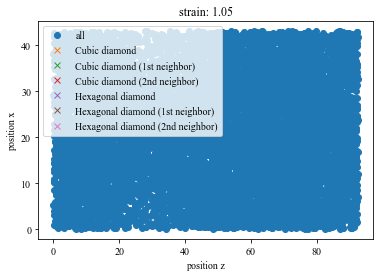

No handles with labels found to put in legend.


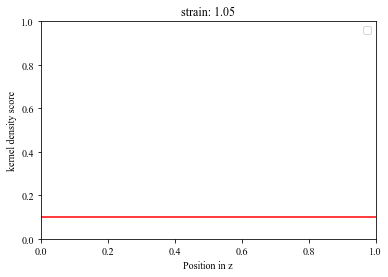

2448.63 0.0 0.0 0.0
{'timestep': 2, 'fit_range': 0.05, 'nve_run_time_steps': 25000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 2448.63, 'center': 1.0}


The job ham_npt_solid_2448_63 was saved and received the ID: 104


The job ham_npt_liquid_high_3448_63 was saved and received the ID: 105


The job ham_npt_liquid_low_2448_63 was saved and received the ID: 106


2020-11-30 22:34:37,809 - pyiron_log - WARNING - Job 'ham_nve_0_95_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_0_95_2448_63_0 was saved and received the ID: 107


2020-11-30 22:37:00,726 - pyiron_log - WARNING - Job 'ham_nve_0_955_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_0_955_2448_63_0 was saved and received the ID: 108


2020-11-30 22:39:21,279 - pyiron_log - WARNING - Job 'ham_nve_0_96_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_0_96_2448_63_0 was saved and received the ID: 109


2020-11-30 22:41:40,301 - pyiron_log - WARNING - Job 'ham_nve_0_965_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_0_965_2448_63_0 was saved and received the ID: 110


2020-11-30 22:43:57,271 - pyiron_log - WARNING - Job 'ham_nve_0_97_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_0_97_2448_63_0 was saved and received the ID: 111


2020-11-30 22:46:12,876 - pyiron_log - WARNING - Job 'ham_nve_0_975_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_0_975_2448_63_0 was saved and received the ID: 112


2020-11-30 22:48:26,163 - pyiron_log - WARNING - Job 'ham_nve_0_98_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_0_98_2448_63_0 was saved and received the ID: 113


2020-11-30 22:50:37,445 - pyiron_log - WARNING - Job 'ham_nve_0_985_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_0_985_2448_63_0 was saved and received the ID: 114


2020-11-30 22:52:46,980 - pyiron_log - WARNING - Job 'ham_nve_0_99_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_0_99_2448_63_0 was saved and received the ID: 115


2020-11-30 22:54:54,751 - pyiron_log - WARNING - Job 'ham_nve_0_995_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_0_995_2448_63_0 was saved and received the ID: 116


2020-11-30 22:57:00,389 - pyiron_log - WARNING - Job 'ham_nve_1_0_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_1_0_2448_63_0 was saved and received the ID: 117


2020-11-30 22:59:05,442 - pyiron_log - WARNING - Job 'ham_nve_1_005_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_1_005_2448_63_0 was saved and received the ID: 118


2020-11-30 23:01:08,287 - pyiron_log - WARNING - Job 'ham_nve_1_01_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_1_01_2448_63_0 was saved and received the ID: 119


2020-11-30 23:03:09,095 - pyiron_log - WARNING - Job 'ham_nve_1_015_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_1_015_2448_63_0 was saved and received the ID: 120


2020-11-30 23:05:08,789 - pyiron_log - WARNING - Job 'ham_nve_1_02_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_1_02_2448_63_0 was saved and received the ID: 121


2020-11-30 23:07:06,942 - pyiron_log - WARNING - Job 'ham_nve_1_025_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_1_025_2448_63_0 was saved and received the ID: 122


2020-11-30 23:09:03,580 - pyiron_log - WARNING - Job 'ham_nve_1_03_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_1_03_2448_63_0 was saved and received the ID: 123


2020-11-30 23:10:58,869 - pyiron_log - WARNING - Job 'ham_nve_1_035_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_1_035_2448_63_0 was saved and received the ID: 124


2020-11-30 23:12:53,141 - pyiron_log - WARNING - Job 'ham_nve_1_04_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_1_04_2448_63_0 was saved and received the ID: 125


2020-11-30 23:14:51,319 - pyiron_log - WARNING - Job 'ham_nve_1_045_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_1_045_2448_63_0 was saved and received the ID: 126


2020-11-30 23:16:43,223 - pyiron_log - WARNING - Job 'ham_nve_1_05_2448_63_0' does not exist and cannot be loaded


The job ham_nvt_1_05_2448_63_0 was saved and received the ID: 127


The job ham_nve_0_95_2448_63_0 was saved and received the ID: 128


The job ham_nve_0_955_2448_63_0 was saved and received the ID: 129


The job ham_nve_0_96_2448_63_0 was saved and received the ID: 130


The job ham_nve_0_965_2448_63_0 was saved and received the ID: 131


The job ham_nve_0_97_2448_63_0 was saved and received the ID: 132


The job ham_nve_0_975_2448_63_0 was saved and received the ID: 133


The job ham_nve_0_98_2448_63_0 was saved and received the ID: 134


The job ham_nve_0_985_2448_63_0 was saved and received the ID: 135


The job ham_nve_0_99_2448_63_0 was saved and received the ID: 136


The job ham_nve_0_995_2448_63_0 was saved and received the ID: 137


The job ham_nve_1_0_2448_63_0 was saved and received the ID: 138


The job ham_nve_1_005_2448_63_0 was saved and received the ID: 139


The job ham_nve_1_01_2448_63_0 was saved and received the ID: 140


The job ham_nve_1_015_2448_63_0 was saved and received the ID: 141


The job ham_nve_1_02_2448_63_0 was saved and received the ID: 142


The job ham_nve_1_025_2448_63_0 was saved and received the ID: 143


The job ham_nve_1_03_2448_63_0 was saved and received the ID: 144


The job ham_nve_1_035_2448_63_0 was saved and received the ID: 145


The job ham_nve_1_04_2448_63_0 was saved and received the ID: 146


The job ham_nve_1_045_2448_63_0 was saved and received the ID: 147


The job ham_nve_1_05_2448_63_0 was saved and received the ID: 148


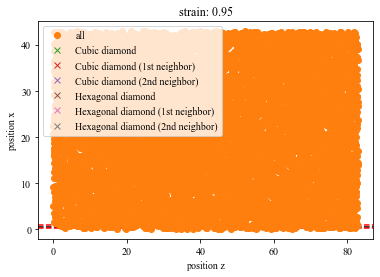

No handles with labels found to put in legend.


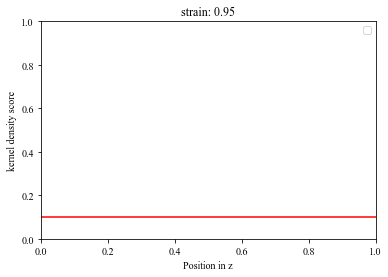

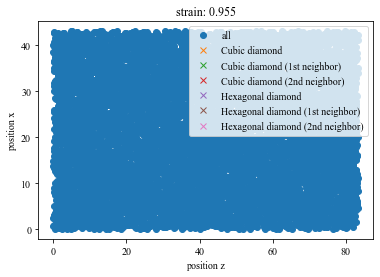

No handles with labels found to put in legend.


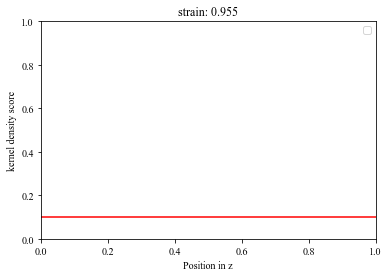

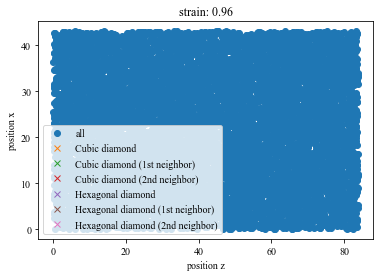

No handles with labels found to put in legend.


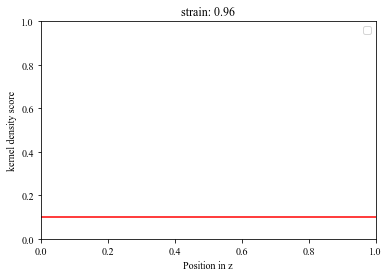

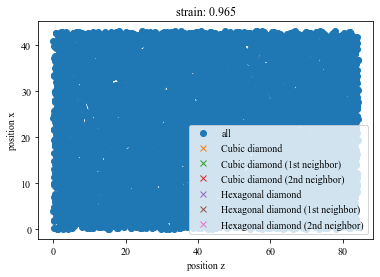

No handles with labels found to put in legend.


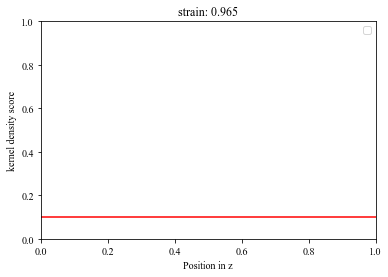

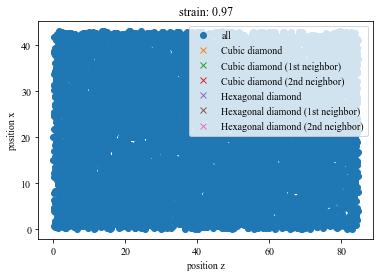

No handles with labels found to put in legend.


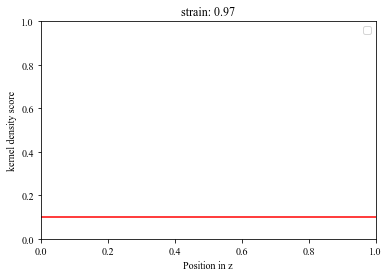

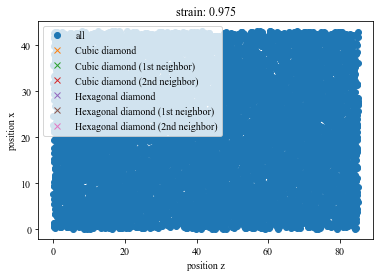

No handles with labels found to put in legend.


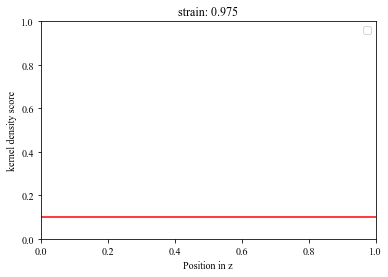

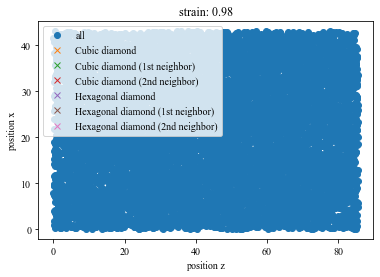

No handles with labels found to put in legend.


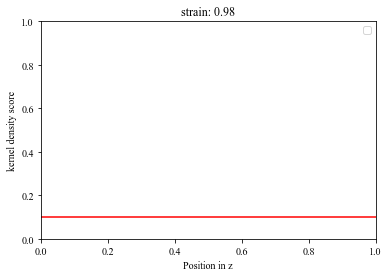

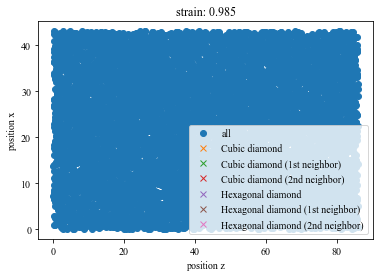

No handles with labels found to put in legend.


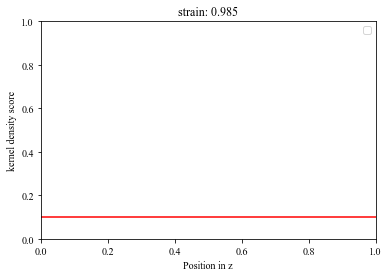

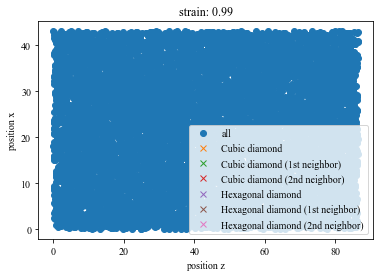

No handles with labels found to put in legend.


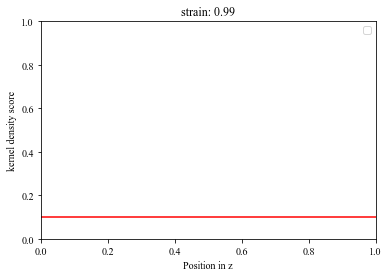

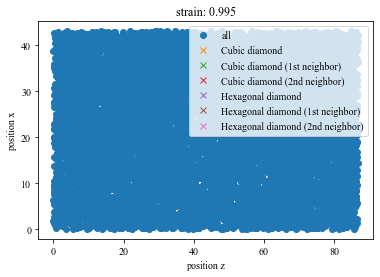

No handles with labels found to put in legend.


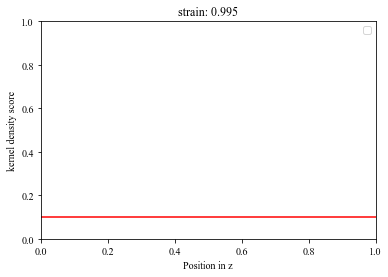

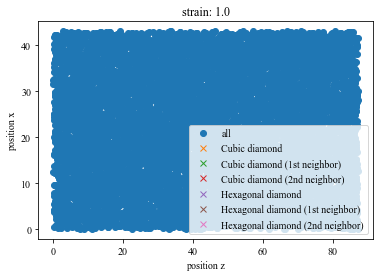

No handles with labels found to put in legend.


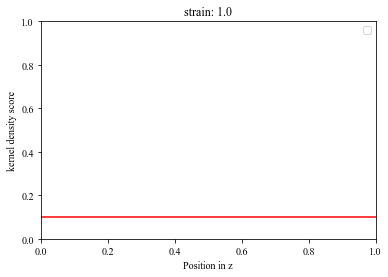

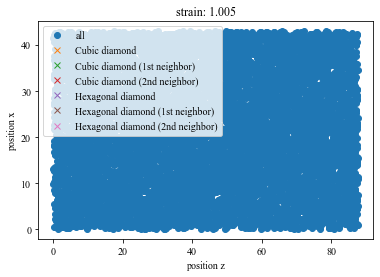

No handles with labels found to put in legend.


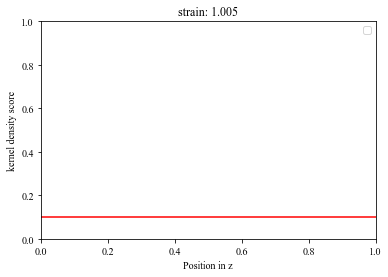

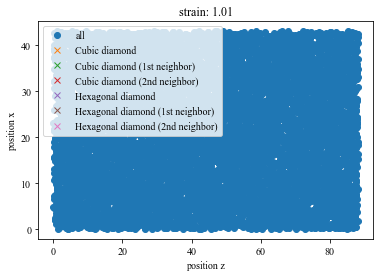

No handles with labels found to put in legend.


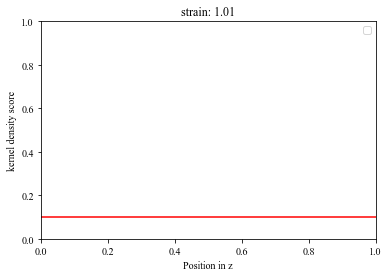

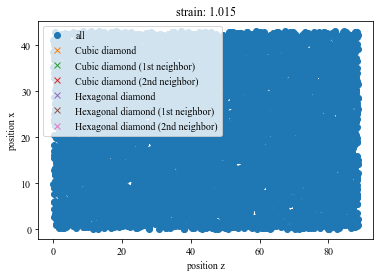

No handles with labels found to put in legend.


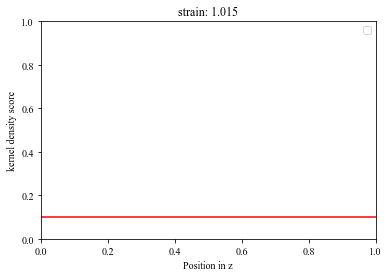

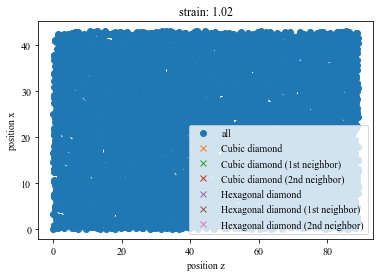

No handles with labels found to put in legend.


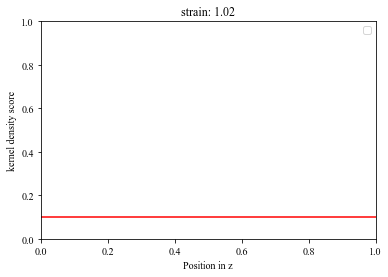

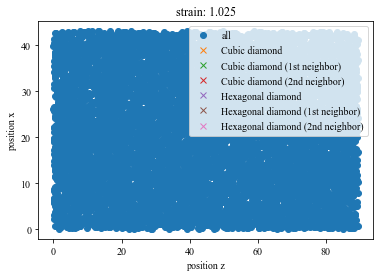

No handles with labels found to put in legend.


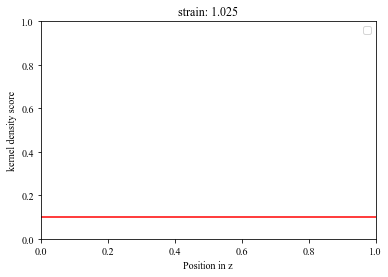

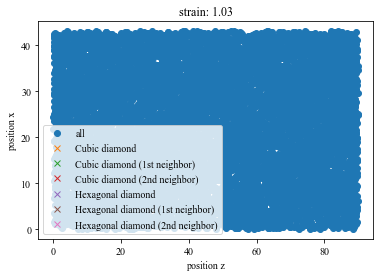

No handles with labels found to put in legend.


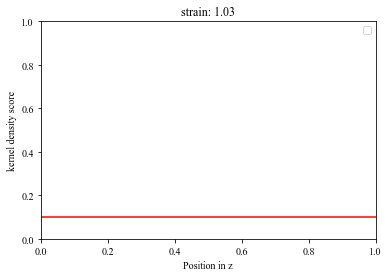

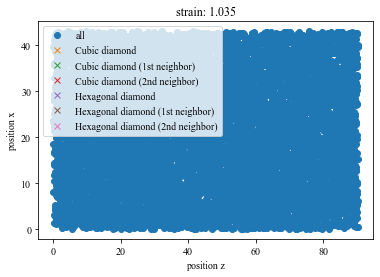

No handles with labels found to put in legend.


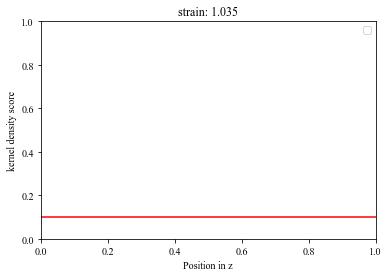

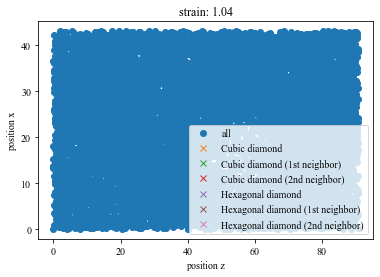

No handles with labels found to put in legend.


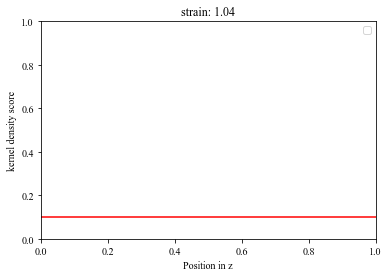

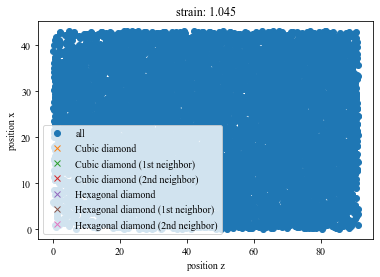

No handles with labels found to put in legend.


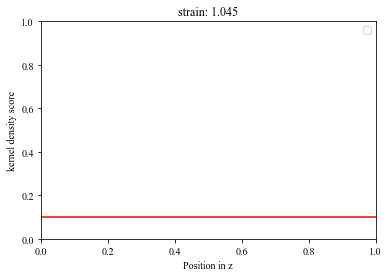

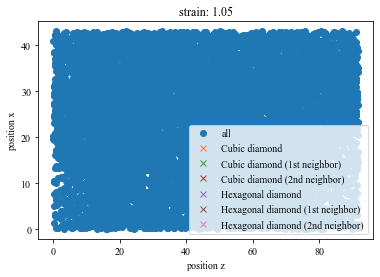

No handles with labels found to put in legend.


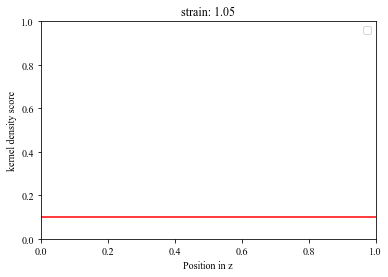

2203.7670000000003 0.0 0.0 0.0
{'timestep': 2, 'fit_range': 0.05, 'nve_run_time_steps': 25000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 2203.7670000000003, 'center': 1.0}


The job ham_npt_solid_2203_77 was saved and received the ID: 149


The job ham_npt_liquid_high_3203_77 was saved and received the ID: 150


The job ham_npt_liquid_low_2203_77 was saved and received the ID: 151


2020-12-01 01:33:24,606 - pyiron_log - WARNING - Job 'ham_nve_0_95_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_0_95_2203_77_0 was saved and received the ID: 152


2020-12-01 01:35:31,579 - pyiron_log - WARNING - Job 'ham_nve_0_955_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_0_955_2203_77_0 was saved and received the ID: 153


2020-12-01 01:37:37,249 - pyiron_log - WARNING - Job 'ham_nve_0_96_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_0_96_2203_77_0 was saved and received the ID: 154


2020-12-01 01:39:40,320 - pyiron_log - WARNING - Job 'ham_nve_0_965_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_0_965_2203_77_0 was saved and received the ID: 155


2020-12-01 01:41:42,411 - pyiron_log - WARNING - Job 'ham_nve_0_97_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_0_97_2203_77_0 was saved and received the ID: 156


2020-12-01 01:43:42,977 - pyiron_log - WARNING - Job 'ham_nve_0_975_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_0_975_2203_77_0 was saved and received the ID: 157


2020-12-01 01:45:40,566 - pyiron_log - WARNING - Job 'ham_nve_0_98_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_0_98_2203_77_0 was saved and received the ID: 158


2020-12-01 01:47:38,179 - pyiron_log - WARNING - Job 'ham_nve_0_985_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_0_985_2203_77_0 was saved and received the ID: 159


2020-12-01 01:49:32,687 - pyiron_log - WARNING - Job 'ham_nve_0_99_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_0_99_2203_77_0 was saved and received the ID: 160


2020-12-01 01:51:25,353 - pyiron_log - WARNING - Job 'ham_nve_0_995_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_0_995_2203_77_0 was saved and received the ID: 161


2020-12-01 01:53:16,488 - pyiron_log - WARNING - Job 'ham_nve_1_0_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_1_0_2203_77_0 was saved and received the ID: 162


2020-12-01 01:55:04,094 - pyiron_log - WARNING - Job 'ham_nve_1_005_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_1_005_2203_77_0 was saved and received the ID: 163


2020-12-01 01:56:51,718 - pyiron_log - WARNING - Job 'ham_nve_1_01_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_1_01_2203_77_0 was saved and received the ID: 164


2020-12-01 01:58:42,406 - pyiron_log - WARNING - Job 'ham_nve_1_015_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_1_015_2203_77_0 was saved and received the ID: 165


2020-12-01 02:00:27,378 - pyiron_log - WARNING - Job 'ham_nve_1_02_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_1_02_2203_77_0 was saved and received the ID: 166


2020-12-01 02:02:22,565 - pyiron_log - WARNING - Job 'ham_nve_1_025_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_1_025_2203_77_0 was saved and received the ID: 167


2020-12-01 02:04:15,862 - pyiron_log - WARNING - Job 'ham_nve_1_03_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_1_03_2203_77_0 was saved and received the ID: 168


2020-12-01 02:06:11,108 - pyiron_log - WARNING - Job 'ham_nve_1_035_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_1_035_2203_77_0 was saved and received the ID: 169


2020-12-01 02:08:02,288 - pyiron_log - WARNING - Job 'ham_nve_1_04_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_1_04_2203_77_0 was saved and received the ID: 170


2020-12-01 02:09:57,964 - pyiron_log - WARNING - Job 'ham_nve_1_045_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_1_045_2203_77_0 was saved and received the ID: 171


2020-12-01 02:11:54,502 - pyiron_log - WARNING - Job 'ham_nve_1_05_2203_77_0' does not exist and cannot be loaded


The job ham_nvt_1_05_2203_77_0 was saved and received the ID: 172


The job ham_nve_0_95_2203_77_0 was saved and received the ID: 173


The job ham_nve_0_955_2203_77_0 was saved and received the ID: 174


The job ham_nve_0_96_2203_77_0 was saved and received the ID: 175


The job ham_nve_0_965_2203_77_0 was saved and received the ID: 176


The job ham_nve_0_97_2203_77_0 was saved and received the ID: 177


The job ham_nve_0_975_2203_77_0 was saved and received the ID: 178


The job ham_nve_0_98_2203_77_0 was saved and received the ID: 179


The job ham_nve_0_985_2203_77_0 was saved and received the ID: 180


The job ham_nve_0_99_2203_77_0 was saved and received the ID: 181


The job ham_nve_0_995_2203_77_0 was saved and received the ID: 182


The job ham_nve_1_0_2203_77_0 was saved and received the ID: 183


The job ham_nve_1_005_2203_77_0 was saved and received the ID: 184


The job ham_nve_1_01_2203_77_0 was saved and received the ID: 185


The job ham_nve_1_015_2203_77_0 was saved and received the ID: 186


The job ham_nve_1_02_2203_77_0 was saved and received the ID: 187


The job ham_nve_1_025_2203_77_0 was saved and received the ID: 188


The job ham_nve_1_03_2203_77_0 was saved and received the ID: 189


The job ham_nve_1_035_2203_77_0 was saved and received the ID: 190


The job ham_nve_1_04_2203_77_0 was saved and received the ID: 191


The job ham_nve_1_045_2203_77_0 was saved and received the ID: 192


The job ham_nve_1_05_2203_77_0 was saved and received the ID: 193


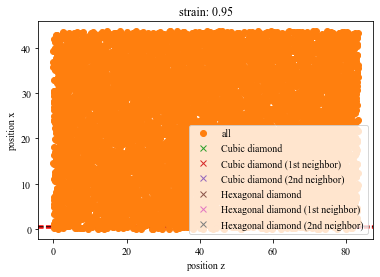

No handles with labels found to put in legend.


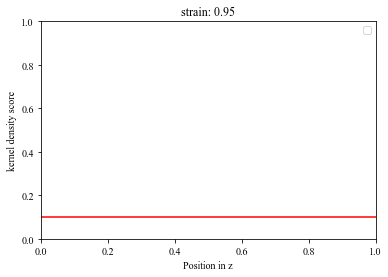

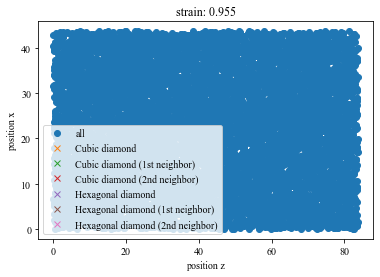

No handles with labels found to put in legend.


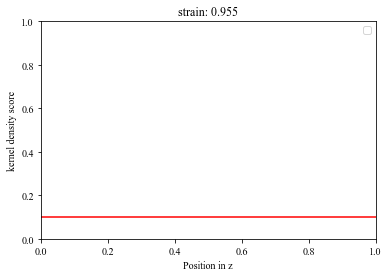

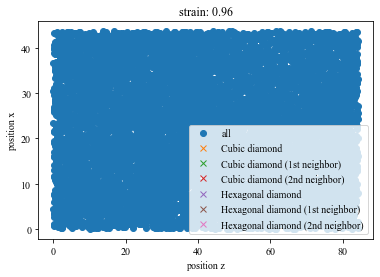

No handles with labels found to put in legend.


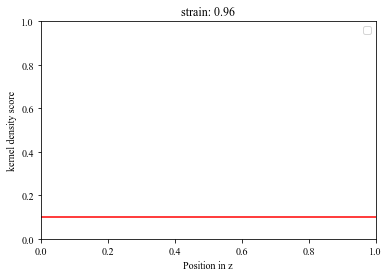

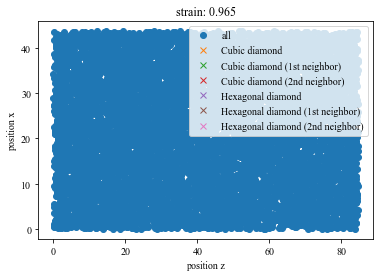

No handles with labels found to put in legend.


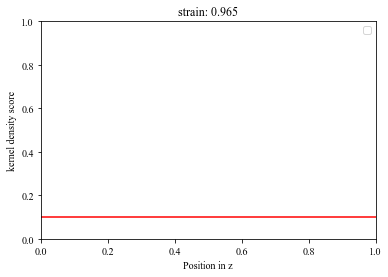

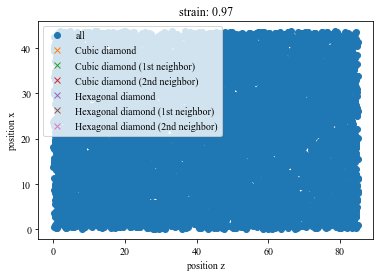

No handles with labels found to put in legend.


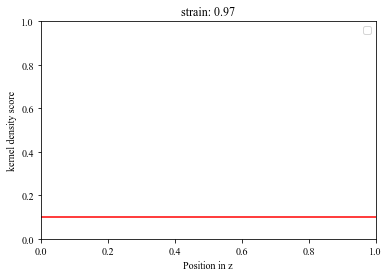

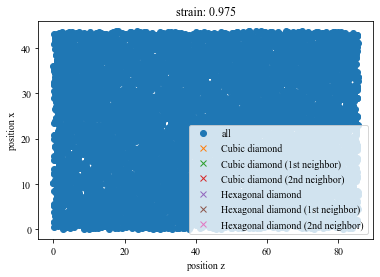

No handles with labels found to put in legend.


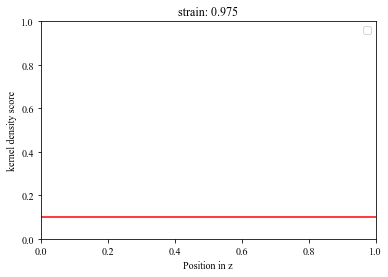

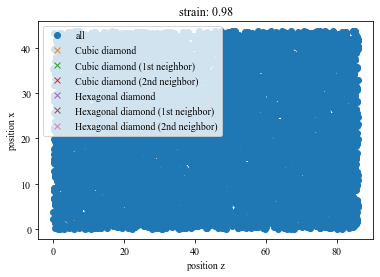

No handles with labels found to put in legend.


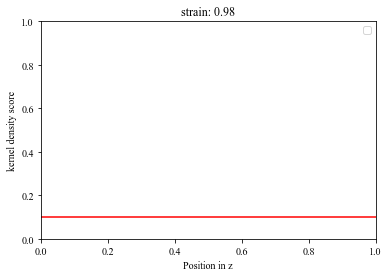

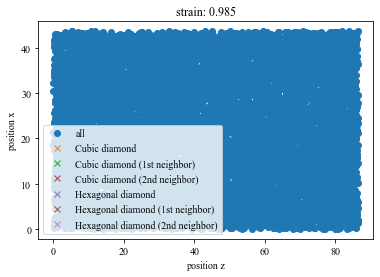

No handles with labels found to put in legend.


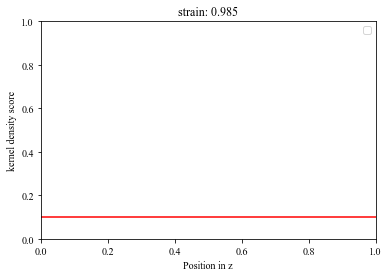

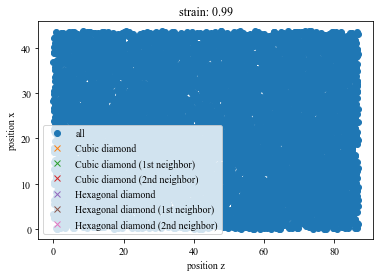

No handles with labels found to put in legend.


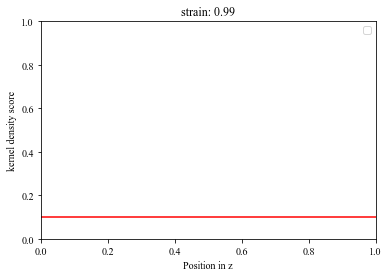

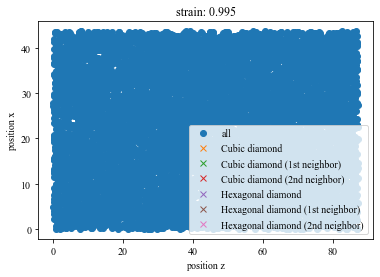

No handles with labels found to put in legend.


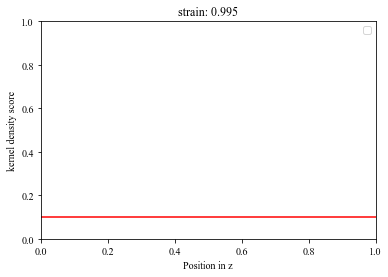

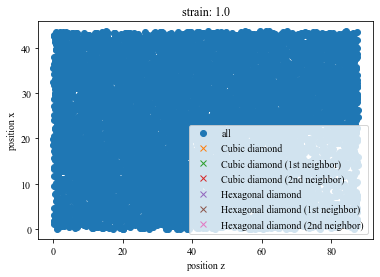

No handles with labels found to put in legend.


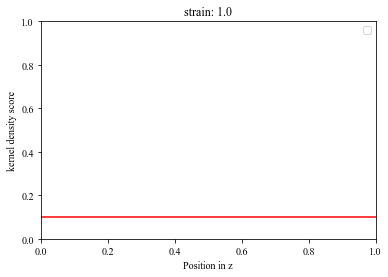

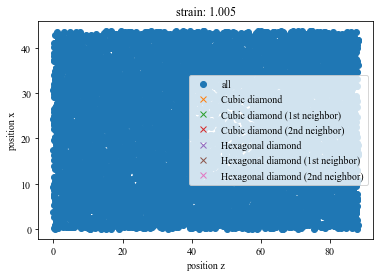

No handles with labels found to put in legend.


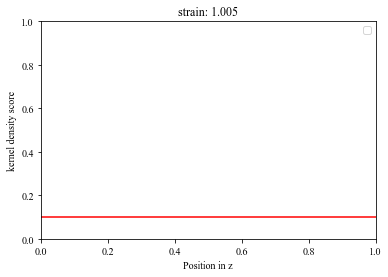

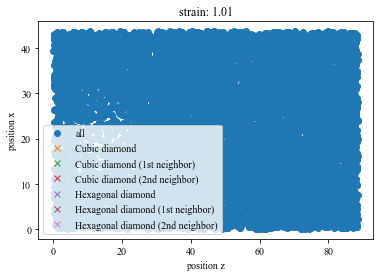

No handles with labels found to put in legend.


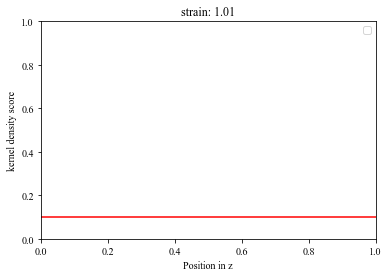

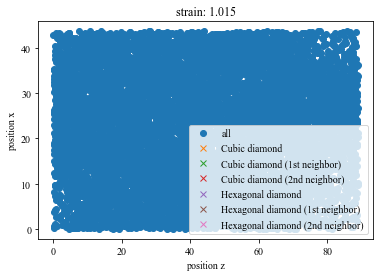

No handles with labels found to put in legend.


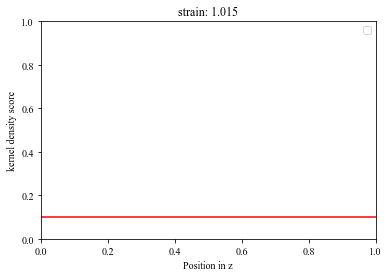

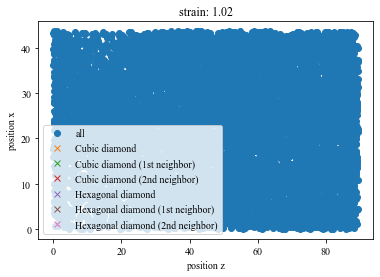

No handles with labels found to put in legend.


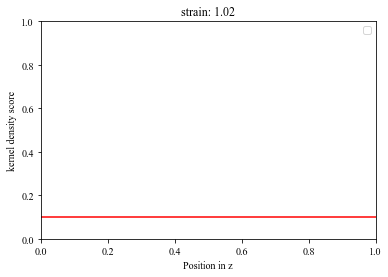

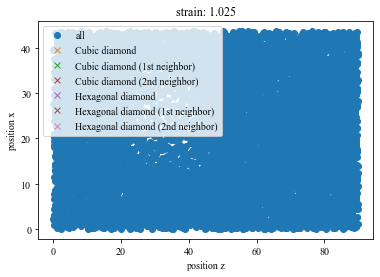

No handles with labels found to put in legend.


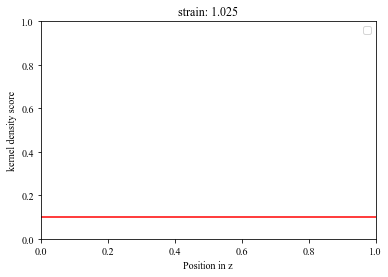

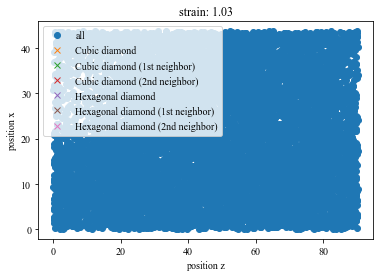

No handles with labels found to put in legend.


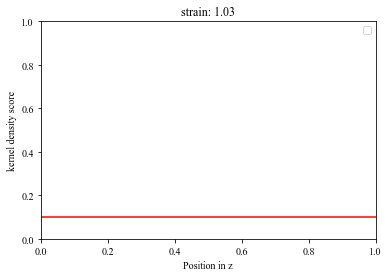

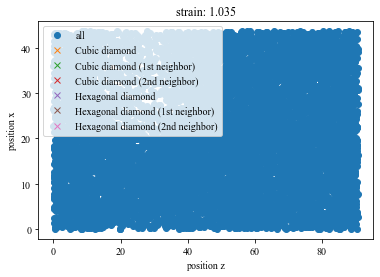

No handles with labels found to put in legend.


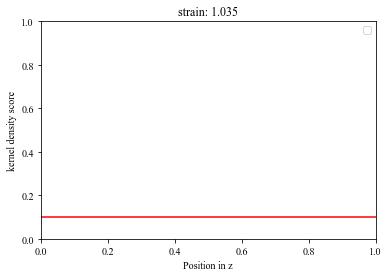

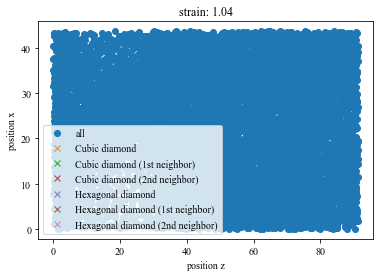

No handles with labels found to put in legend.


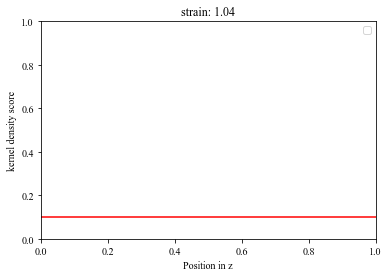

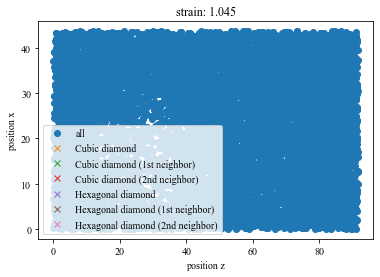

No handles with labels found to put in legend.


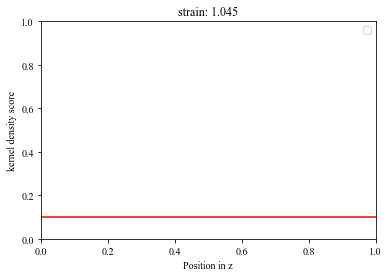

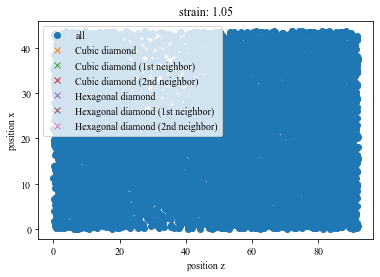

No handles with labels found to put in legend.


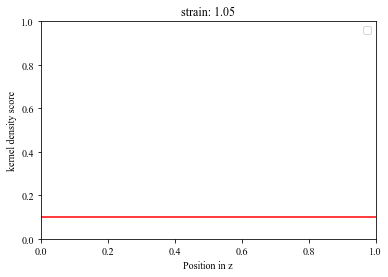

1983.393 0.0 0.0 0.0
{'timestep': 2, 'fit_range': 0.05, 'nve_run_time_steps': 25000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 1983.393, 'center': 1.0}


The job ham_npt_solid_1983_39 was saved and received the ID: 194


The job ham_npt_liquid_high_2983_3900000000003 was saved and received the ID: 195


The job ham_npt_liquid_low_1983_39 was saved and received the ID: 196


2020-12-01 04:26:29,254 - pyiron_log - WARNING - Job 'ham_nve_0_95_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_0_95_1983_39_0 was saved and received the ID: 197


2020-12-01 04:28:40,047 - pyiron_log - WARNING - Job 'ham_nve_0_955_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_0_955_1983_39_0 was saved and received the ID: 198


2020-12-01 04:30:48,810 - pyiron_log - WARNING - Job 'ham_nve_0_96_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_0_96_1983_39_0 was saved and received the ID: 199


2020-12-01 04:32:55,989 - pyiron_log - WARNING - Job 'ham_nve_0_965_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_0_965_1983_39_0 was saved and received the ID: 200


2020-12-01 04:35:01,627 - pyiron_log - WARNING - Job 'ham_nve_0_97_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_0_97_1983_39_0 was saved and received the ID: 201


2020-12-01 04:37:04,405 - pyiron_log - WARNING - Job 'ham_nve_0_975_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_0_975_1983_39_0 was saved and received the ID: 202


2020-12-01 04:39:04,458 - pyiron_log - WARNING - Job 'ham_nve_0_98_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_0_98_1983_39_0 was saved and received the ID: 203


2020-12-01 04:41:03,263 - pyiron_log - WARNING - Job 'ham_nve_0_985_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_0_985_1983_39_0 was saved and received the ID: 204


2020-12-01 04:43:00,509 - pyiron_log - WARNING - Job 'ham_nve_0_99_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_0_99_1983_39_0 was saved and received the ID: 205


2020-12-01 04:44:55,249 - pyiron_log - WARNING - Job 'ham_nve_0_995_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_0_995_1983_39_0 was saved and received the ID: 206


2020-12-01 04:46:47,685 - pyiron_log - WARNING - Job 'ham_nve_1_0_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_1_0_1983_39_0 was saved and received the ID: 207


2020-12-01 04:48:38,005 - pyiron_log - WARNING - Job 'ham_nve_1_005_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_1_005_1983_39_0 was saved and received the ID: 208


2020-12-01 04:50:25,043 - pyiron_log - WARNING - Job 'ham_nve_1_01_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_1_01_1983_39_0 was saved and received the ID: 209


2020-12-01 04:52:09,798 - pyiron_log - WARNING - Job 'ham_nve_1_015_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_1_015_1983_39_0 was saved and received the ID: 210


2020-12-01 04:53:53,286 - pyiron_log - WARNING - Job 'ham_nve_1_02_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_1_02_1983_39_0 was saved and received the ID: 211


2020-12-01 04:55:35,199 - pyiron_log - WARNING - Job 'ham_nve_1_025_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_1_025_1983_39_0 was saved and received the ID: 212


2020-12-01 04:57:21,737 - pyiron_log - WARNING - Job 'ham_nve_1_03_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_1_03_1983_39_0 was saved and received the ID: 213


2020-12-01 04:59:10,451 - pyiron_log - WARNING - Job 'ham_nve_1_035_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_1_035_1983_39_0 was saved and received the ID: 214


2020-12-01 05:01:01,598 - pyiron_log - WARNING - Job 'ham_nve_1_04_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_1_04_1983_39_0 was saved and received the ID: 215


2020-12-01 05:02:51,721 - pyiron_log - WARNING - Job 'ham_nve_1_045_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_1_045_1983_39_0 was saved and received the ID: 216


2020-12-01 05:04:40,107 - pyiron_log - WARNING - Job 'ham_nve_1_05_1983_39_0' does not exist and cannot be loaded


The job ham_nvt_1_05_1983_39_0 was saved and received the ID: 217


The job ham_nve_0_95_1983_39_0 was saved and received the ID: 218


The job ham_nve_0_955_1983_39_0 was saved and received the ID: 219


The job ham_nve_0_96_1983_39_0 was saved and received the ID: 220


The job ham_nve_0_965_1983_39_0 was saved and received the ID: 221


The job ham_nve_0_97_1983_39_0 was saved and received the ID: 222


The job ham_nve_0_975_1983_39_0 was saved and received the ID: 223


The job ham_nve_0_98_1983_39_0 was saved and received the ID: 224


The job ham_nve_0_985_1983_39_0 was saved and received the ID: 225


The job ham_nve_0_99_1983_39_0 was saved and received the ID: 226


The job ham_nve_0_995_1983_39_0 was saved and received the ID: 227


The job ham_nve_1_0_1983_39_0 was saved and received the ID: 228


The job ham_nve_1_005_1983_39_0 was saved and received the ID: 229


The job ham_nve_1_01_1983_39_0 was saved and received the ID: 230


The job ham_nve_1_015_1983_39_0 was saved and received the ID: 231


The job ham_nve_1_02_1983_39_0 was saved and received the ID: 232


The job ham_nve_1_025_1983_39_0 was saved and received the ID: 233


The job ham_nve_1_03_1983_39_0 was saved and received the ID: 234


The job ham_nve_1_035_1983_39_0 was saved and received the ID: 235


The job ham_nve_1_04_1983_39_0 was saved and received the ID: 236


The job ham_nve_1_045_1983_39_0 was saved and received the ID: 237


The job ham_nve_1_05_1983_39_0 was saved and received the ID: 238


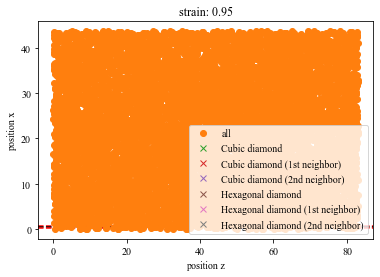

No handles with labels found to put in legend.


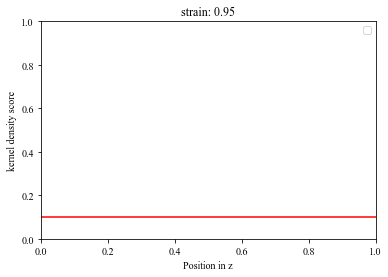

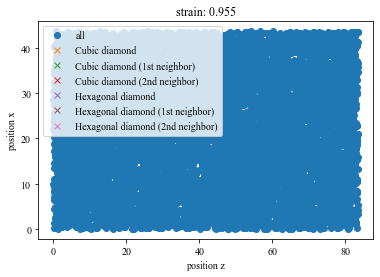

No handles with labels found to put in legend.


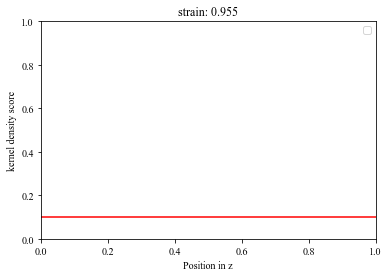

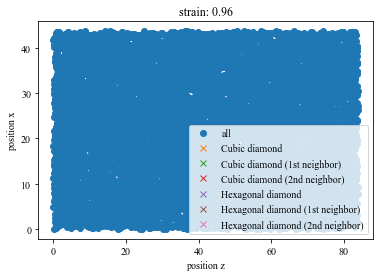

No handles with labels found to put in legend.


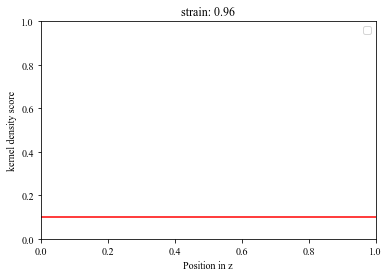

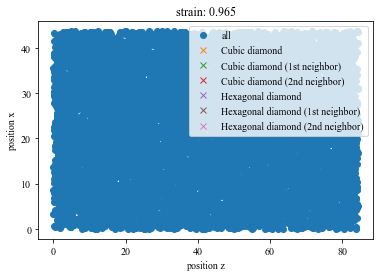

No handles with labels found to put in legend.


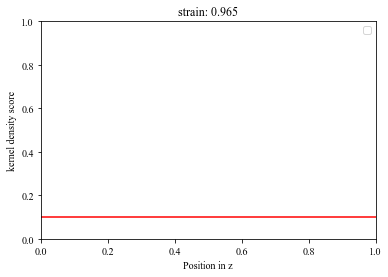

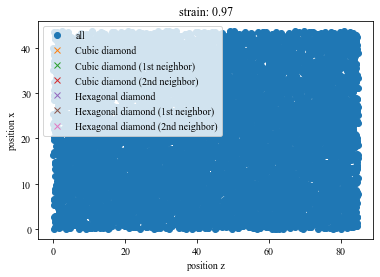

No handles with labels found to put in legend.


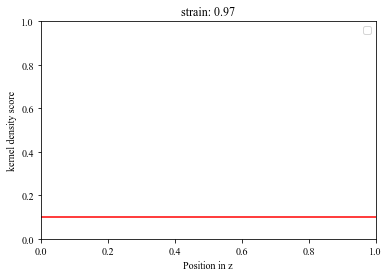

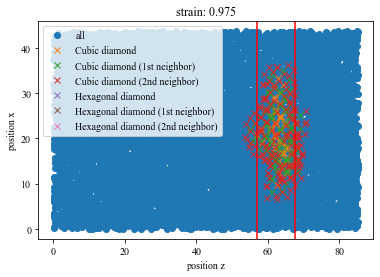

No handles with labels found to put in legend.


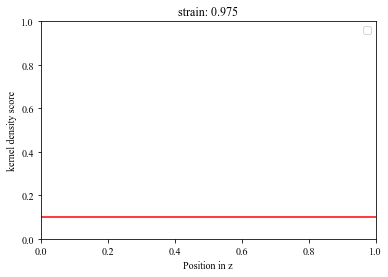

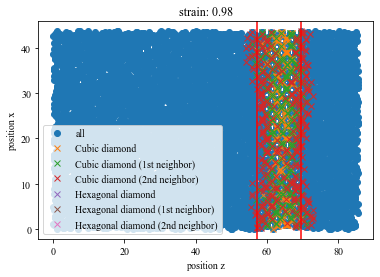

No handles with labels found to put in legend.


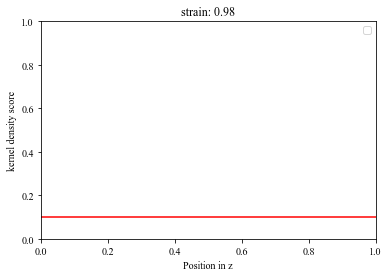

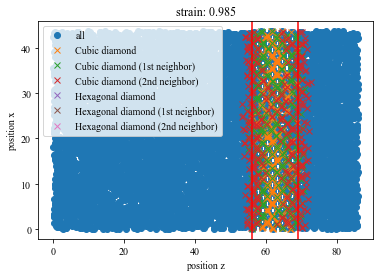

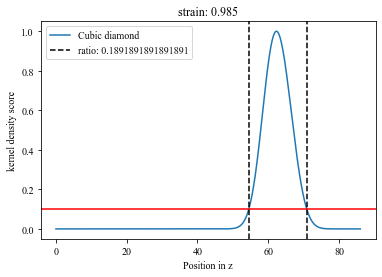

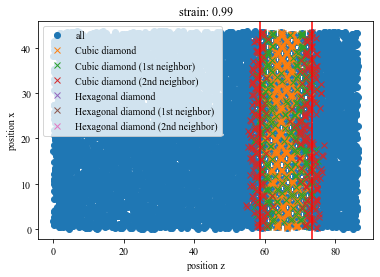

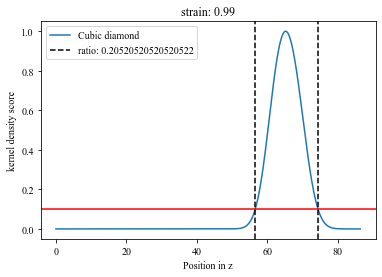

...

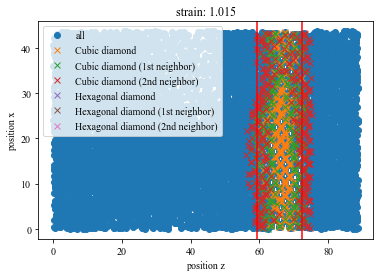

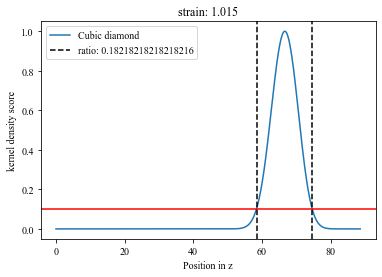

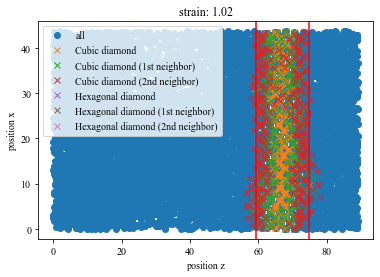

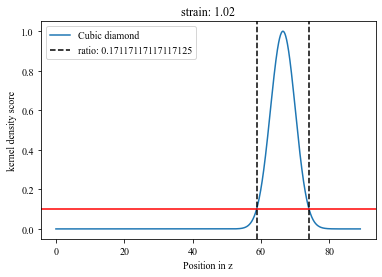

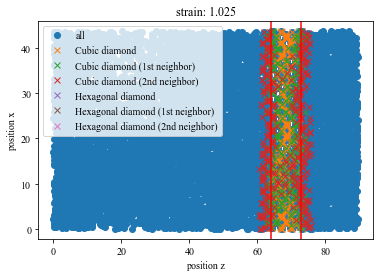

No handles with labels found to put in legend.


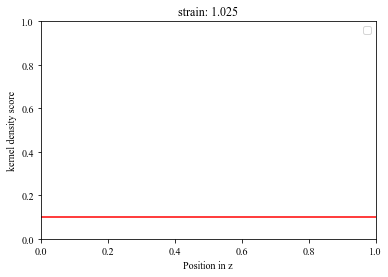

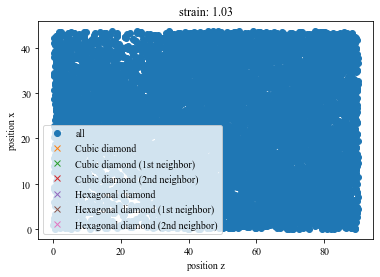

No handles with labels found to put in legend.


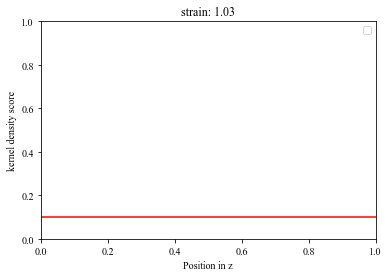

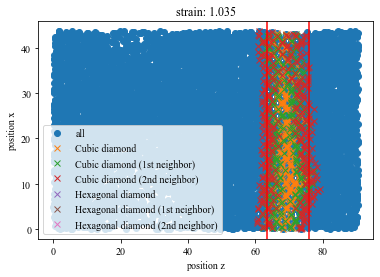

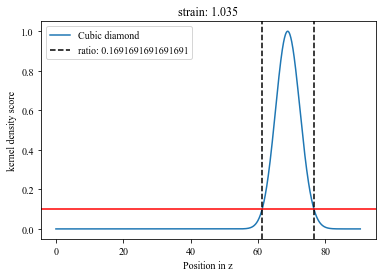

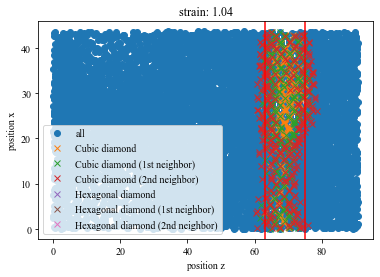

No handles with labels found to put in legend.


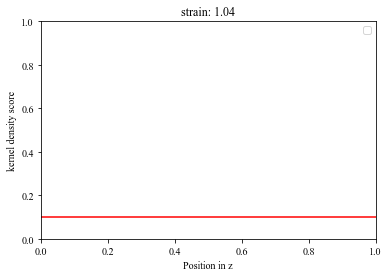

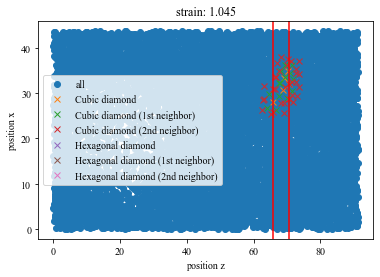

No handles with labels found to put in legend.


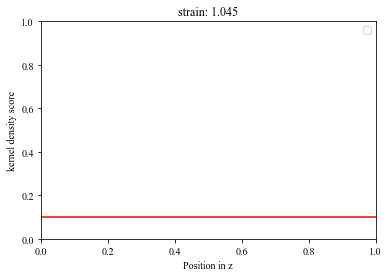

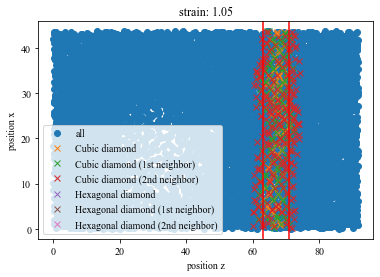

No handles with labels found to put in legend.


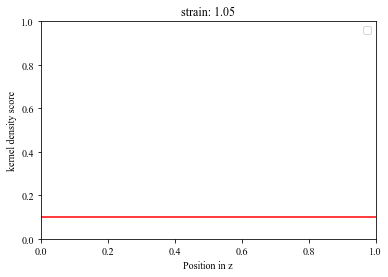

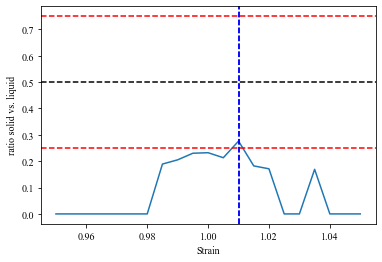

1785.0510000000002 0.0 0.0 0.0
{'timestep': 2, 'fit_range': 0.05, 'nve_run_time_steps': 25000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 1785.0510000000002, 'center': 1.01}


/scratch/janssen/pyiron_meltingpoint/.snakemake/conda/9e28c1ea/lib/python3.9/site-packages/pyiron/thermodynamics/interfacemethod.py:1209: RankWarning: Polyfit may be poorly conditioned
  center = np.abs(get_center_point(


The job ham_npt_solid_1785_05 was saved and received the ID: 239


The job ham_npt_liquid_high_2785_05 was saved and received the ID: 240


The job ham_npt_liquid_low_1785_05 was saved and received the ID: 241


2020-12-01 07:13:23,185 - pyiron_log - WARNING - Job 'ham_nve_0_96_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_0_96_1785_05_0 was saved and received the ID: 242


2020-12-01 07:15:34,141 - pyiron_log - WARNING - Job 'ham_nve_0_965_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_0_965_1785_05_0 was saved and received the ID: 243


2020-12-01 07:17:40,678 - pyiron_log - WARNING - Job 'ham_nve_0_97_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_0_97_1785_05_0 was saved and received the ID: 244


2020-12-01 07:19:45,107 - pyiron_log - WARNING - Job 'ham_nve_0_975_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_0_975_1785_05_0 was saved and received the ID: 245


2020-12-01 07:21:47,819 - pyiron_log - WARNING - Job 'ham_nve_0_98_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_0_98_1785_05_0 was saved and received the ID: 246


2020-12-01 07:23:46,973 - pyiron_log - WARNING - Job 'ham_nve_0_985_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_0_985_1785_05_0 was saved and received the ID: 247


2020-12-01 07:25:43,202 - pyiron_log - WARNING - Job 'ham_nve_0_99_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_0_99_1785_05_0 was saved and received the ID: 248


2020-12-01 07:27:39,083 - pyiron_log - WARNING - Job 'ham_nve_0_995_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_0_995_1785_05_0 was saved and received the ID: 249


2020-12-01 07:29:30,411 - pyiron_log - WARNING - Job 'ham_nve_1_0_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_1_0_1785_05_0 was saved and received the ID: 250


2020-12-01 07:31:20,418 - pyiron_log - WARNING - Job 'ham_nve_1_005_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_1_005_1785_05_0 was saved and received the ID: 251


2020-12-01 07:33:06,847 - pyiron_log - WARNING - Job 'ham_nve_1_01_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_1_01_1785_05_0 was saved and received the ID: 252


2020-12-01 07:34:52,111 - pyiron_log - WARNING - Job 'ham_nve_1_015_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_1_015_1785_05_0 was saved and received the ID: 253


2020-12-01 07:36:34,082 - pyiron_log - WARNING - Job 'ham_nve_1_02_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_1_02_1785_05_0 was saved and received the ID: 254


2020-12-01 07:38:14,364 - pyiron_log - WARNING - Job 'ham_nve_1_025_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_1_025_1785_05_0 was saved and received the ID: 255


2020-12-01 07:39:56,559 - pyiron_log - WARNING - Job 'ham_nve_1_03_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_1_03_1785_05_0 was saved and received the ID: 256


2020-12-01 07:41:32,224 - pyiron_log - WARNING - Job 'ham_nve_1_035_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_1_035_1785_05_0 was saved and received the ID: 257


2020-12-01 07:43:19,319 - pyiron_log - WARNING - Job 'ham_nve_1_04_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_1_04_1785_05_0 was saved and received the ID: 258


2020-12-01 07:45:02,914 - pyiron_log - WARNING - Job 'ham_nve_1_045_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_1_045_1785_05_0 was saved and received the ID: 259


2020-12-01 07:46:55,442 - pyiron_log - WARNING - Job 'ham_nve_1_05_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_1_05_1785_05_0 was saved and received the ID: 260


2020-12-01 07:48:42,385 - pyiron_log - WARNING - Job 'ham_nve_1_055_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_1_055_1785_05_0 was saved and received the ID: 261


2020-12-01 07:50:30,046 - pyiron_log - WARNING - Job 'ham_nve_1_06_1785_05_0' does not exist and cannot be loaded


The job ham_nvt_1_06_1785_05_0 was saved and received the ID: 262


The job ham_nve_0_96_1785_05_0 was saved and received the ID: 263


The job ham_nve_0_965_1785_05_0 was saved and received the ID: 264


The job ham_nve_0_97_1785_05_0 was saved and received the ID: 265


The job ham_nve_0_975_1785_05_0 was saved and received the ID: 266


The job ham_nve_0_98_1785_05_0 was saved and received the ID: 267


The job ham_nve_0_985_1785_05_0 was saved and received the ID: 268


The job ham_nve_0_99_1785_05_0 was saved and received the ID: 269


The job ham_nve_0_995_1785_05_0 was saved and received the ID: 270


The job ham_nve_1_0_1785_05_0 was saved and received the ID: 271


The job ham_nve_1_005_1785_05_0 was saved and received the ID: 272


The job ham_nve_1_01_1785_05_0 was saved and received the ID: 273


The job ham_nve_1_015_1785_05_0 was saved and received the ID: 274


The job ham_nve_1_02_1785_05_0 was saved and received the ID: 275


The job ham_nve_1_025_1785_05_0 was saved and received the ID: 276


The job ham_nve_1_03_1785_05_0 was saved and received the ID: 277


The job ham_nve_1_035_1785_05_0 was saved and received the ID: 278


The job ham_nve_1_04_1785_05_0 was saved and received the ID: 279


The job ham_nve_1_045_1785_05_0 was saved and received the ID: 280


The job ham_nve_1_05_1785_05_0 was saved and received the ID: 281


The job ham_nve_1_055_1785_05_0 was saved and received the ID: 282


The job ham_nve_1_06_1785_05_0 was saved and received the ID: 283


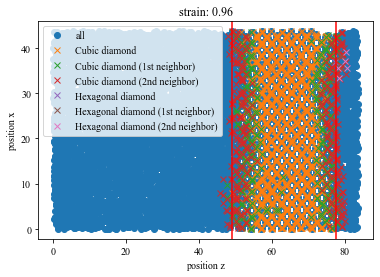

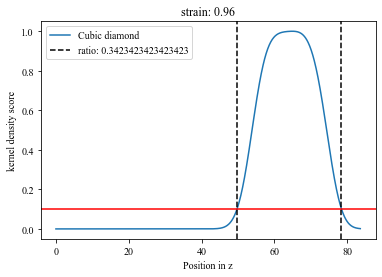

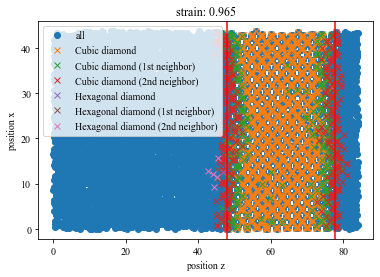

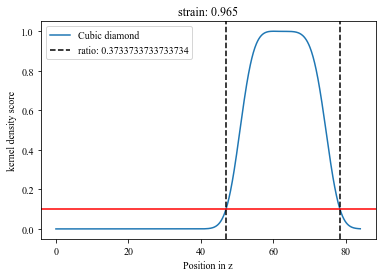

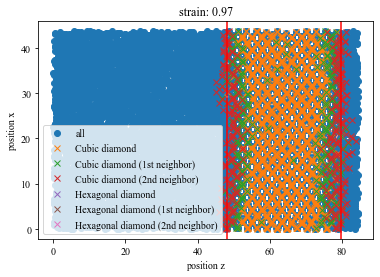

...

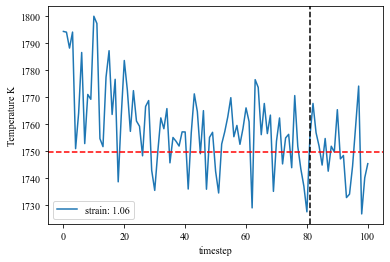

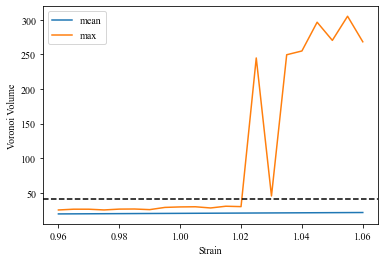

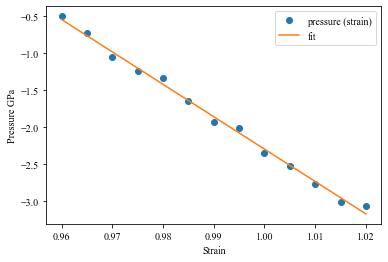

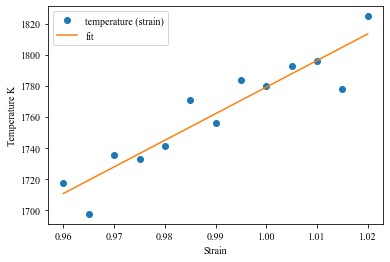

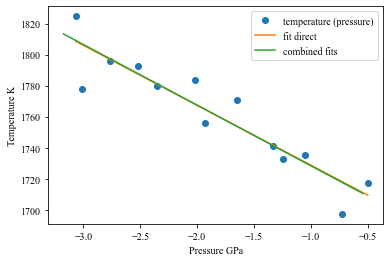

1690.0303418641538 1689.1821265315666
1690.0303418641538 1761.0131005221056 1729.163792888002 1792.862408156209
{'timestep': 2, 'fit_range': 0.05, 'nve_run_time_steps': 25000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 1690.0303418641538, 'center': 0.95}


The job ham_npt_solid_1690_03 was saved and received the ID: 284


The job ham_npt_liquid_high_2690_0299999999997 was saved and received the ID: 285


The job ham_npt_liquid_low_1690_03 was saved and received the ID: 286


2020-12-01 09:56:25,210 - pyiron_log - WARNING - Job 'ham_nve_0_9_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_9_1690_03_0 was saved and received the ID: 287


2020-12-01 09:59:00,974 - pyiron_log - WARNING - Job 'ham_nve_0_905_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_905_1690_03_0 was saved and received the ID: 288


2020-12-01 10:01:35,045 - pyiron_log - WARNING - Job 'ham_nve_0_91_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_91_1690_03_0 was saved and received the ID: 289


2020-12-01 10:04:06,505 - pyiron_log - WARNING - Job 'ham_nve_0_915_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_915_1690_03_0 was saved and received the ID: 290


2020-12-01 10:06:38,050 - pyiron_log - WARNING - Job 'ham_nve_0_92_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_92_1690_03_0 was saved and received the ID: 291


2020-12-01 10:09:06,993 - pyiron_log - WARNING - Job 'ham_nve_0_925_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_925_1690_03_0 was saved and received the ID: 292


2020-12-01 10:11:33,375 - pyiron_log - WARNING - Job 'ham_nve_0_93_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_93_1690_03_0 was saved and received the ID: 293


2020-12-01 10:13:55,553 - pyiron_log - WARNING - Job 'ham_nve_0_935_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_935_1690_03_0 was saved and received the ID: 294


2020-12-01 10:16:18,279 - pyiron_log - WARNING - Job 'ham_nve_0_94_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_94_1690_03_0 was saved and received the ID: 295


2020-12-01 10:18:37,136 - pyiron_log - WARNING - Job 'ham_nve_0_945_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_945_1690_03_0 was saved and received the ID: 296


2020-12-01 10:20:54,281 - pyiron_log - WARNING - Job 'ham_nve_0_95_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_95_1690_03_0 was saved and received the ID: 297


2020-12-01 10:23:09,153 - pyiron_log - WARNING - Job 'ham_nve_0_955_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_955_1690_03_0 was saved and received the ID: 298


2020-12-01 10:25:21,297 - pyiron_log - WARNING - Job 'ham_nve_0_96_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_96_1690_03_0 was saved and received the ID: 299


2020-12-01 10:27:30,994 - pyiron_log - WARNING - Job 'ham_nve_0_965_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_965_1690_03_0 was saved and received the ID: 300


2020-12-01 10:29:38,748 - pyiron_log - WARNING - Job 'ham_nve_0_97_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_97_1690_03_0 was saved and received the ID: 301


2020-12-01 10:31:43,552 - pyiron_log - WARNING - Job 'ham_nve_0_975_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_975_1690_03_0 was saved and received the ID: 302


2020-12-01 10:33:45,912 - pyiron_log - WARNING - Job 'ham_nve_0_98_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_98_1690_03_0 was saved and received the ID: 303


2020-12-01 10:35:44,229 - pyiron_log - WARNING - Job 'ham_nve_0_985_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_985_1690_03_0 was saved and received the ID: 304


2020-12-01 10:37:40,408 - pyiron_log - WARNING - Job 'ham_nve_0_99_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_99_1690_03_0 was saved and received the ID: 305


2020-12-01 10:39:33,844 - pyiron_log - WARNING - Job 'ham_nve_0_995_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_0_995_1690_03_0 was saved and received the ID: 306


2020-12-01 10:41:24,272 - pyiron_log - WARNING - Job 'ham_nve_1_0_1690_03_0' does not exist and cannot be loaded


The job ham_nvt_1_0_1690_03_0 was saved and received the ID: 307


The job ham_nve_0_9_1690_03_0 was saved and received the ID: 308


The job ham_nve_0_905_1690_03_0 was saved and received the ID: 309


The job ham_nve_0_91_1690_03_0 was saved and received the ID: 310


The job ham_nve_0_915_1690_03_0 was saved and received the ID: 311


The job ham_nve_0_92_1690_03_0 was saved and received the ID: 312


The job ham_nve_0_925_1690_03_0 was saved and received the ID: 313


The job ham_nve_0_93_1690_03_0 was saved and received the ID: 314


The job ham_nve_0_935_1690_03_0 was saved and received the ID: 315


The job ham_nve_0_94_1690_03_0 was saved and received the ID: 316


The job ham_nve_0_945_1690_03_0 was saved and received the ID: 317


The job ham_nve_0_95_1690_03_0 was saved and received the ID: 318


The job ham_nve_0_955_1690_03_0 was saved and received the ID: 319


The job ham_nve_0_96_1690_03_0 was saved and received the ID: 320


The job ham_nve_0_965_1690_03_0 was saved and received the ID: 321


The job ham_nve_0_97_1690_03_0 was saved and received the ID: 322


The job ham_nve_0_975_1690_03_0 was saved and received the ID: 323


The job ham_nve_0_98_1690_03_0 was saved and received the ID: 324


The job ham_nve_0_985_1690_03_0 was saved and received the ID: 325


The job ham_nve_0_99_1690_03_0 was saved and received the ID: 326


The job ham_nve_0_995_1690_03_0 was saved and received the ID: 327


The job ham_nve_1_0_1690_03_0 was saved and received the ID: 328


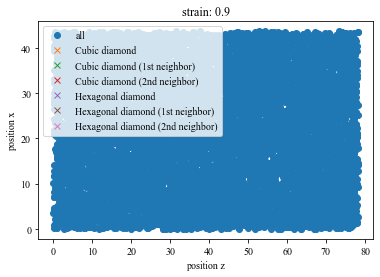

No handles with labels found to put in legend.


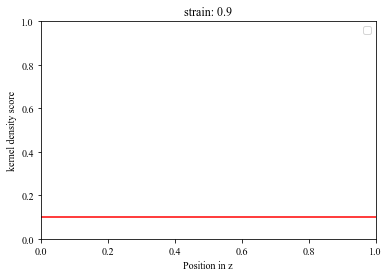

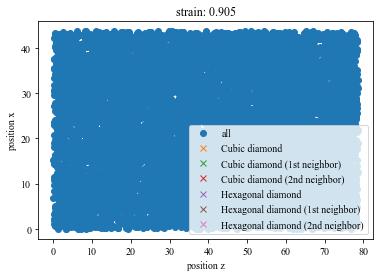

No handles with labels found to put in legend.


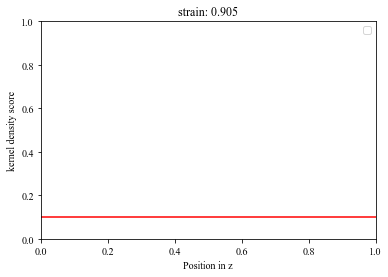

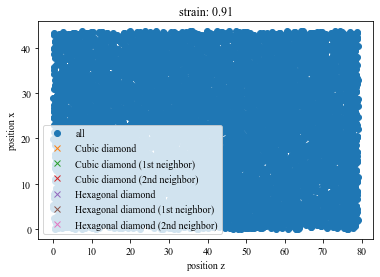

No handles with labels found to put in legend.


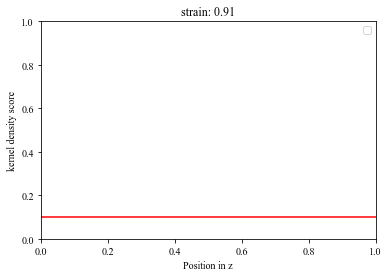

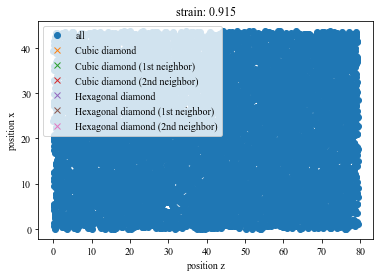

No handles with labels found to put in legend.


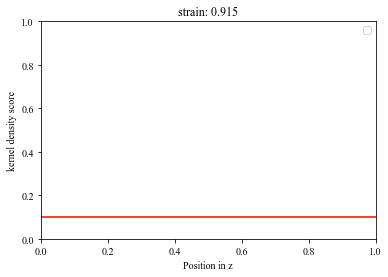

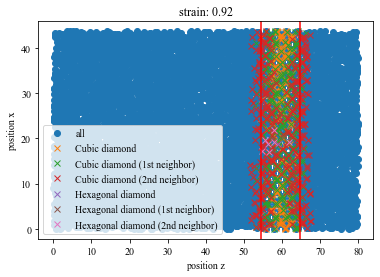

No handles with labels found to put in legend.


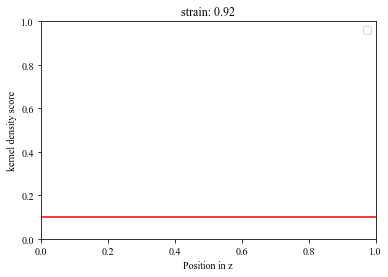

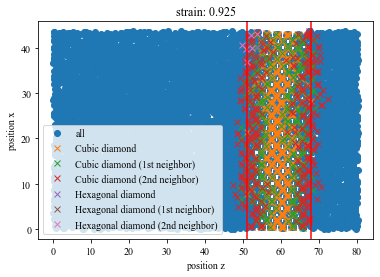

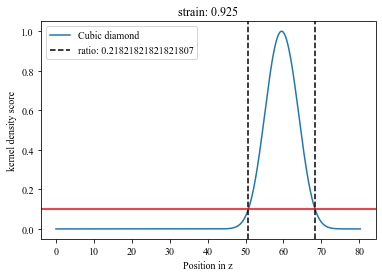

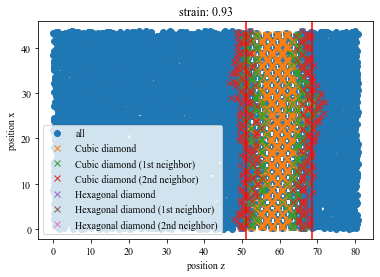

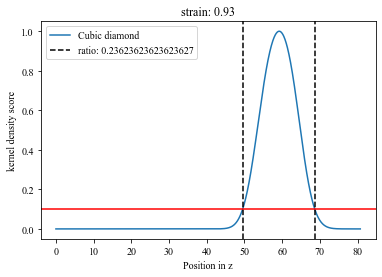

...

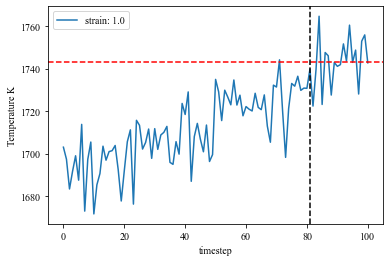

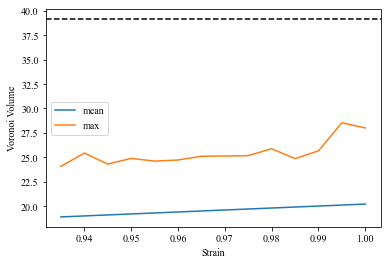

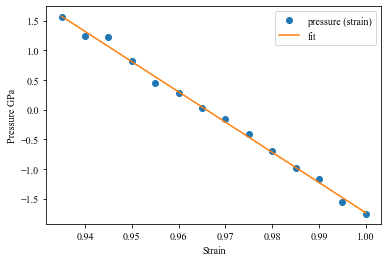

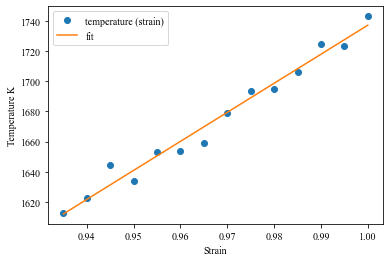

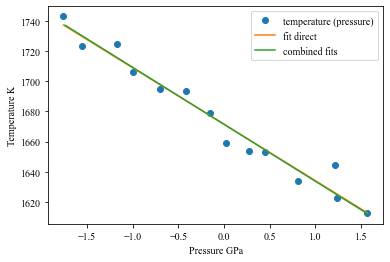

1671.504843569491 1671.4766102230356
1671.504843569491 1677.8900442609145 1645.2671663188785 1710.5129222029504
{'timestep': 2, 'fit_range': 0.01, 'nve_run_time_steps': 20000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 1671.504843569491, 'center': 0.97}


The job ham_npt_solid_1671_5 was saved and received the ID: 329


The job ham_npt_liquid_high_2671_5 was saved and received the ID: 330


The job ham_npt_liquid_low_1671_5 was saved and received the ID: 331


2020-12-01 13:03:04,631 - pyiron_log - WARNING - Job 'ham_nve_0_96_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_96_1671_5_1 was saved and received the ID: 332


2020-12-01 13:05:15,107 - pyiron_log - WARNING - Job 'ham_nve_0_961_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_961_1671_5_1 was saved and received the ID: 333


2020-12-01 13:07:24,969 - pyiron_log - WARNING - Job 'ham_nve_0_962_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_962_1671_5_1 was saved and received the ID: 334


2020-12-01 13:09:34,081 - pyiron_log - WARNING - Job 'ham_nve_0_963_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_963_1671_5_1 was saved and received the ID: 335


2020-12-01 13:11:43,078 - pyiron_log - WARNING - Job 'ham_nve_0_964_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_964_1671_5_1 was saved and received the ID: 336


2020-12-01 13:13:51,072 - pyiron_log - WARNING - Job 'ham_nve_0_965_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_965_1671_5_1 was saved and received the ID: 337


2020-12-01 13:15:58,234 - pyiron_log - WARNING - Job 'ham_nve_0_966_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_966_1671_5_1 was saved and received the ID: 338


2020-12-01 13:18:05,331 - pyiron_log - WARNING - Job 'ham_nve_0_967_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_967_1671_5_1 was saved and received the ID: 339


2020-12-01 13:20:11,984 - pyiron_log - WARNING - Job 'ham_nve_0_968_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_968_1671_5_1 was saved and received the ID: 340


2020-12-01 13:22:16,080 - pyiron_log - WARNING - Job 'ham_nve_0_969_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_969_1671_5_1 was saved and received the ID: 341


2020-12-01 13:24:21,643 - pyiron_log - WARNING - Job 'ham_nve_0_97_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_97_1671_5_1 was saved and received the ID: 342


2020-12-01 13:26:25,822 - pyiron_log - WARNING - Job 'ham_nve_0_971_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_971_1671_5_1 was saved and received the ID: 343


2020-12-01 13:28:30,509 - pyiron_log - WARNING - Job 'ham_nve_0_972_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_972_1671_5_1 was saved and received the ID: 344


2020-12-01 13:30:34,728 - pyiron_log - WARNING - Job 'ham_nve_0_973_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_973_1671_5_1 was saved and received the ID: 345


2020-12-01 13:32:37,668 - pyiron_log - WARNING - Job 'ham_nve_0_974_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_974_1671_5_1 was saved and received the ID: 346


2020-12-01 13:34:40,177 - pyiron_log - WARNING - Job 'ham_nve_0_975_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_975_1671_5_1 was saved and received the ID: 347


2020-12-01 13:36:43,017 - pyiron_log - WARNING - Job 'ham_nve_0_976_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_976_1671_5_1 was saved and received the ID: 348


2020-12-01 13:38:44,446 - pyiron_log - WARNING - Job 'ham_nve_0_977_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_977_1671_5_1 was saved and received the ID: 349


2020-12-01 13:40:46,134 - pyiron_log - WARNING - Job 'ham_nve_0_978_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_978_1671_5_1 was saved and received the ID: 350


2020-12-01 13:42:46,696 - pyiron_log - WARNING - Job 'ham_nve_0_979_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_979_1671_5_1 was saved and received the ID: 351


2020-12-01 13:44:46,959 - pyiron_log - WARNING - Job 'ham_nve_0_98_1671_5_1' does not exist and cannot be loaded


The job ham_nvt_0_98_1671_5_1 was saved and received the ID: 352


The job ham_nve_0_96_1671_5_1 was saved and received the ID: 353


The job ham_nve_0_961_1671_5_1 was saved and received the ID: 354


The job ham_nve_0_962_1671_5_1 was saved and received the ID: 355


The job ham_nve_0_963_1671_5_1 was saved and received the ID: 356


The job ham_nve_0_964_1671_5_1 was saved and received the ID: 357


The job ham_nve_0_965_1671_5_1 was saved and received the ID: 358


The job ham_nve_0_966_1671_5_1 was saved and received the ID: 359


The job ham_nve_0_967_1671_5_1 was saved and received the ID: 360


The job ham_nve_0_968_1671_5_1 was saved and received the ID: 361


The job ham_nve_0_969_1671_5_1 was saved and received the ID: 362


The job ham_nve_0_97_1671_5_1 was saved and received the ID: 363


The job ham_nve_0_971_1671_5_1 was saved and received the ID: 364


The job ham_nve_0_972_1671_5_1 was saved and received the ID: 365


The job ham_nve_0_973_1671_5_1 was saved and received the ID: 366


The job ham_nve_0_974_1671_5_1 was saved and received the ID: 367


The job ham_nve_0_975_1671_5_1 was saved and received the ID: 368


The job ham_nve_0_976_1671_5_1 was saved and received the ID: 369


The job ham_nve_0_977_1671_5_1 was saved and received the ID: 370


The job ham_nve_0_978_1671_5_1 was saved and received the ID: 371


The job ham_nve_0_979_1671_5_1 was saved and received the ID: 372


The job ham_nve_0_98_1671_5_1 was saved and received the ID: 373


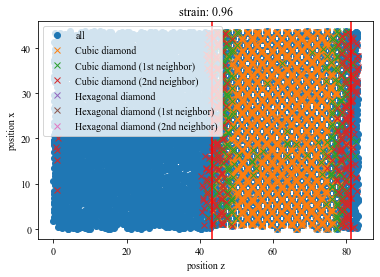

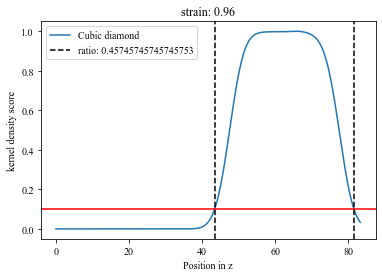

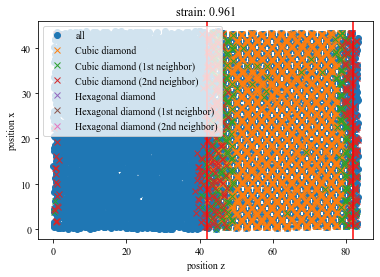

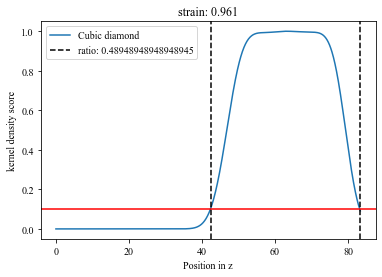

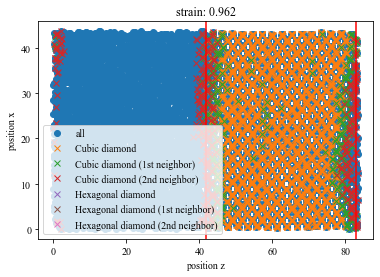

...

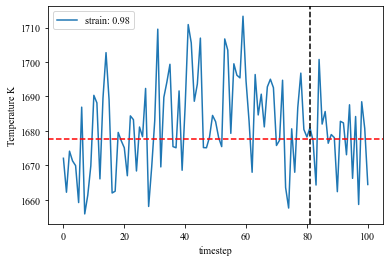

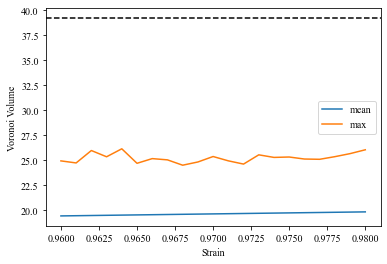

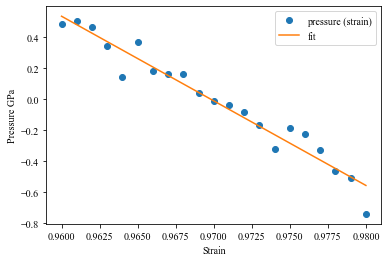

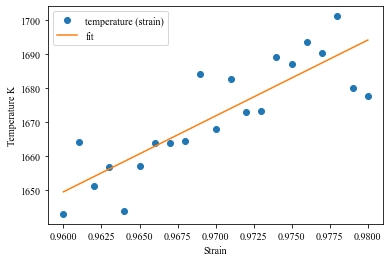

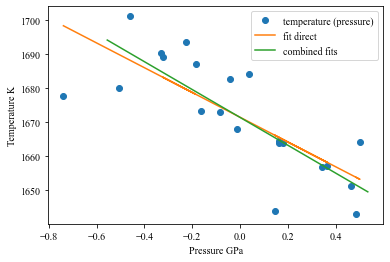

1671.425886176618 1671.3792065025261
1671.425886176618 1672.0488039173392 1657.5477026342335 1686.5499052004452
{'timestep': 1, 'fit_range': 0.01, 'nve_run_time_steps': 50000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 1671.425886176618, 'center': 0.97}


In [36]:
temperature_estimate_lst, temperature_calculated_lst = [], []
while len(temperature_calculated_lst) < 3 or not convergence_goal_achieved and len(temperature_calculated_lst) < 10:
    temperature_estimate_lst.append(temperature_next)
    temperature_next, temperature_mean, temperature_left, temperature_right, strain_result_lst, pressure_result_lst = calc_temp_iteration(
        basis=ham_minimize_vol.get_structure().repeat([1,1,2]), 
        temperature_next=temperature_next, 
        project_parameter=project_parameter,
        timestep=timestep,
        nve_run_time_steps=nve_run_time_steps, 
        fit_range=fit_range,  
        center=center,
        debug_plot=True)
    print(temperature_next, temperature_mean, temperature_left, temperature_right)
    output = validate_convergence(pr=pr,
                                  temperature_left=temperature_left, 
                                  temperature_next=temperature_next, 
                                  temperature_right=temperature_right, 
                                  enable_iteration=enable_iteration,
                                  timestep_iter=timestep_iter,
                                  timestep_lst=project_parameter['timestep_lst'],
                                  timestep=timestep,
                                  fit_range_iter=fit_range_iter, 
                                  fit_range_lst=project_parameter['fit_range_lst'], 
                                  fit_range=fit_range, 
                                  nve_run_time_steps_iter=nve_run_time_steps_iter, 
                                  nve_run_time_steps_lst=project_parameter['nve_run_time_steps_lst'], 
                                  nve_run_time_steps=nve_run_time_steps,
                                  strain_result_lst=strain_result_lst, 
                                  pressure_result_lst=pressure_result_lst, 
                                  step_count=step_count, 
                                  step_dict=step_dict, 
                                  boundary_value=project_parameter['boundary_value'], 
                                  ratio_boundary=project_parameter['ratio_boundary'],
                                  convergence_goal=project_parameter['convergence_criterion'],
                                  output_file=output_file)
    convergence_goal_achieved, enable_iteration, step_count, step_dict, timestep, fit_range, nve_run_time_steps, boundary_value, ratio_boundary, temperature_next, center = output
    print(step_dict[step_count])
    temperature_calculated_lst.append(temperature_next)

In [37]:
if not os.path.exists(output_file):
    with open(output_file, 'w') as f:
        json.dump(step_dict, f)

In [38]:
step_dict

{0: {'temperature_next': 3023},
 1: {'timestep': 2,
  'fit_range': 0.05,
  'nve_run_time_steps': 25000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 2720.7000000000003,
  'center': 1.0},
 2: {'timestep': 2,
  'fit_range': 0.05,
  'nve_run_time_steps': 25000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 2448.63,
  'center': 1.0},
 3: {'timestep': 2,
  'fit_range': 0.05,
  'nve_run_time_steps': 25000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 2203.7670000000003,
  'center': 1.0},
 4: {'timestep': 2,
  'fit_range': 0.05,
  'nve_run_time_steps': 25000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 1983.393,
  'center': 1.0},
 5: {'timestep': 2,
  'fit_range': 0.05,
  'nve_run_time_steps': 25000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 1785.0510000000002,
  'center': 1.01},
 6: {'timestep': 2,
  'fit_range': 0.05,
  'nve_run_time_steps': 250

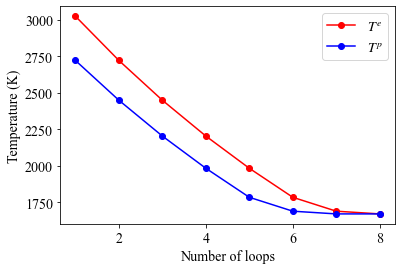

In [39]:
#plot the convergence of loop calculations
first_key = list(step_dict.keys())[-1]
second_key = 'temperature_next'
allt = [step_dict[key][second_key] for key in list(step_dict.keys())]
plt.plot(np.arange(1, len(allt)), allt[0:-1], 'ro-', label=r"$T^e$")
plt.plot(np.arange(1, len(allt)), allt[1:], 'bo-', label=r"$T^p$")
plt.legend(fontsize=14)
plt.tick_params(axis='both', labelsize=14)
plt.xlabel('Number of loops', fontsize=14)
plt.ylabel('Temperature (K)', fontsize=14)
plt.show()

In [40]:
df = pr.job_table()
df

,id,status,chemicalformula,job,subjob,projectpath,project,timestart,timestop,totalcputime,computer,hamilton,hamversion,parentid,masterid
0,1,finished,Si4096,minimize_pos,/minimize_pos,/scratch/janssen/pyiron_meltingpoint/,melting/,2020-11-30 16:00:24.250393,2020-11-30 16:00:25.044963,0.0,pyiron@cmpc05#8,Lammps,0.1,NaN,None
1,2,finished,Si4096,minimize_vol,/minimize_vol,/scratch/janssen/pyiron_meltingpoint/,melting/,2020-11-30 16:00:26.383604,2020-11-30 16:00:27.135256,0.0,pyiron@cmpc05#8,Lammps,0.1,NaN,None
2,3,finished,Si4096,temp_heating_1000,/temp_heating_1000,/scratch/janssen/pyiron_meltingpoint/,melting/,2020-11-30 16:00:31.075160,2020-11-30 16:00:35.252920,4.0,pyiron@cmpc05#8,Lammps,0.1,NaN,None
3,4,finished,Si4096,temp_heating_2000,/temp_heating_2000,/scratch/janssen/pyiron_meltingpoint/,melting/,2020-11-30 16:00:38.049877,2020-11-30 16:00:42.336678,4.0,pyiron@cmpc05#8,Lammps,0.1,NaN,None
4,5,finished,Si4096,temp_heating_3000,/temp_heating_3000,/scratch/janssen/pyiron_meltingpoint/,melting/,2020-11-30 16:00:44.916369,2020-11-30 16:00:49.519669,4.0,pyiron@cmpc05#8,Lammps,0.1,NaN,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368,369,finished,Si8192,ham_nve_0_976_1671_5_1,/ham_nve_0_976_1671_5_1,/scratch/janssen/pyiron_meltingpoint/,melting/,2020-12-01 14:53:24.172836,2020-12-01 14:57:20.305620,236.0,pyiron@cmpc05#8,Lammps,0.1,348.0,None
369,370,finished,Si8192,ham_nve_0_977_1671_5_1,/ham_nve_0_977_1671_5_1,/scratch/janssen/pyiron_meltingpoint/,melting/,2020-12-01 14:57:23.467289,2020-12-01 15:01:18.793262,235.0,pyiron@cmpc05#8,Lammps,0.1,349.0,None
370,371,finished,Si8192,ham_nve_0_978_1671_5_1,/ham_nve_0_978_1671_5_1,/scratch/janssen/pyiron_meltingpoint/,melting/,2020-12-01 15:01:21.834280,2020-12-01 15:05:12.166577,230.0,pyiron@cmpc05#8,Lammps,0.1,350.0,None
371,372,finished,Si8192,ham_nve_0_979_1671_5_1,/ham_nve_0_979_1671_5_1,/scratch/janssen/pyiron_meltingpoint/,melting/,2020-12-01 15:05:15.240650,2020-12-01 15:09:07.446172,232.0,pyiron@cmpc05#8,Lammps,0.1,351.0,None
